# Import Necessary Library

In [30]:
import pandas as pd
import numpy as np

import tensorflow as tf

import warnings
warnings.filterwarnings('ignore')

# 1. Data Collection

In [3]:
forest = pd.read_csv('forestfires (1).csv')
forest

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,large
513,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,...,0,0,0,0,0,0,0,0,0,large
514,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,large
515,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,0,small


# 2.Data Undertsanding

In [5]:
forest.columns

Index(['month', 'day', 'FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind',
       'rain', 'area', 'dayfri', 'daymon', 'daysat', 'daysun', 'daythu',
       'daytue', 'daywed', 'monthapr', 'monthaug', 'monthdec', 'monthfeb',
       'monthjan', 'monthjul', 'monthjun', 'monthmar', 'monthmay', 'monthnov',
       'monthoct', 'monthsep', 'size_category'],
      dtype='object')

In [7]:
forest.dtypes

month             object
day               object
FFMC             float64
DMC              float64
DC               float64
ISI              float64
temp             float64
RH                 int64
wind             float64
rain             float64
area             float64
dayfri             int64
daymon             int64
daysat             int64
daysun             int64
daythu             int64
daytue             int64
daywed             int64
monthapr           int64
monthaug           int64
monthdec           int64
monthfeb           int64
monthjan           int64
monthjul           int64
monthjun           int64
monthmar           int64
monthmay           int64
monthnov           int64
monthoct           int64
monthsep           int64
size_category     object
dtype: object

In [16]:
forest.isna().sum()

month            0
day              0
FFMC             0
DMC              0
DC               0
ISI              0
temp             0
RH               0
wind             0
rain             0
area             0
dayfri           0
daymon           0
daysat           0
daysun           0
daythu           0
daytue           0
daywed           0
monthapr         0
monthaug         0
monthdec         0
monthfeb         0
monthjan         0
monthjul         0
monthjun         0
monthmar         0
monthmay         0
monthnov         0
monthoct         0
monthsep         0
size_category    0
dtype: int64

In [46]:
y.nunique()

size_category    2
dtype: int64

# 3.Data Preparation

In [9]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [57]:
forest.drop(["month","day"],axis=1,inplace = True)
forest['size_category'] = le.fit_transform(forest['size_category'])

In [58]:
X = forest.drop('size_category',axis=1)
y = forest[['size_category']]

In [59]:
from sklearn.preprocessing import StandardScaler
std = StandardScaler()
X_scaled = std.fit_transform(X) 

In [60]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X_scaled,y,test_size=.15,random_state=12,stratify=y)


In [61]:
X_train.shape,y_train.shape

((439, 28), (439, 1))

In [62]:
X_test.shape,y_test.shape

((78, 28), (78, 1))

# 4. Model Building

In [96]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout


In [123]:
tf.random.set_seed(0)

#### Build the architechure

In [205]:
model = Sequential()
model.add(Dense(30, input_dim=28, activation='relu',kernel_initializer = 'uniform'))
model.add(Dropout(.1,tf.random.set_seed(0)))
model.add(Dense(30, activation='relu',kernel_initializer = 'uniform'))
model.add(Dropout(.2,tf.random.set_seed(0)))
model.add(Dense(1, activation='sigmoid',kernel_initializer = 'uniform'))
model.summary()

Model: "sequential_88629"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_265881 (Dense)        (None, 30)                870       
                                                                 
 dropout_177237 (Dropout)    (None, 30)                0         
                                                                 
 dense_265882 (Dense)        (None, 30)                930       
                                                                 
 dropout_177238 (Dropout)    (None, 30)                0         
                                                                 
 dense_265883 (Dense)        (None, 1)                 31        
                                                                 
Total params: 1,831
Trainable params: 1,831
Non-trainable params: 0
_________________________________________________________________


### Compile the architechure

In [206]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics='accuracy')

# 5.Model Training

In [229]:
model.fit(x = X_train,y = y_train,batch_size=10,epochs=50,validation_split=0.2)

Epoch 1/50
36/36 [==============================] - 0s 3ms/step - loss: 0.0159 - accuracy: 0.9943 - val_loss: 0.0252 - val_accuracy: 0.9886
Epoch 2/50
36/36 [==============================] - 0s 2ms/step - loss: 0.0495 - accuracy: 0.9858 - val_loss: 0.0464 - val_accuracy: 0.9773
Epoch 3/50
36/36 [==============================] - 0s 2ms/step - loss: 0.0090 - accuracy: 0.9943 - val_loss: 0.0562 - val_accuracy: 0.9773
Epoch 4/50
36/36 [==============================] - 0s 2ms/step - loss: 0.0224 - accuracy: 0.9972 - val_loss: 0.0539 - val_accuracy: 0.9773
Epoch 5/50
36/36 [==============================] - 0s 2ms/step - loss: 0.0109 - accuracy: 0.9943 - val_loss: 0.0551 - val_accuracy: 0.9773
Epoch 6/50
36/36 [==============================] - 0s 2ms/step - loss: 0.0162 - accuracy: 0.9915 - val_loss: 0.0481 - val_accuracy: 0.9773
Epoch 7/50
36/36 [==============================] - 0s 2ms/step - loss: 0.0057 - accuracy: 1.0000 - val_loss: 0.0443 - val_accuracy: 0.9773
Epoch 8/50
36/36 [==

In [230]:
_, accuracy = model.evaluate(X_train, y_train)
print('Accuracy:',(accuracy*100))

14/14 [==============================] - 0s 997us/step - loss: 0.0093 - accuracy: 0.9954
Accuracy: 99.54441785812378


In [231]:
_, accuracy = model.evaluate(X_test, y_test)
print('Accuracy: ', (accuracy*100))

3/3 [==============================] - 0s 2ms/step - loss: 10.0715 - accuracy: 0.9231
Accuracy:  92.30769276618958


In [243]:
model.history.history.keys()

dict_keys([])

# Obv. Accuracy = 92%

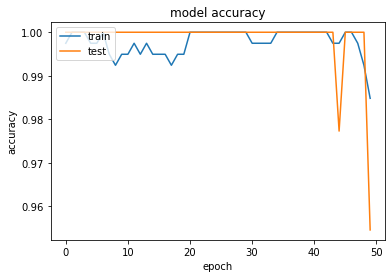

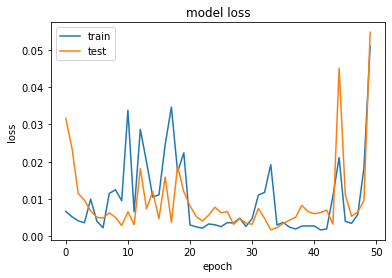

In [216]:
import matplotlib.pyplot as plt
# summarize history for accuracy
plt.plot(model.history.history['accuracy'])
plt.plot(model.history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(model.history.history['loss'])
plt.plot(model.history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

#### Tuning of Hyperparameters :

In [175]:
# Define the grid search parameters

batch_size = [10,20,30]
epochs = [10,50,100]
learning_rate = [0.001,0.01,0.1]
dropout_rate = [0.0,0.1,0.2]
activation_function = ['softmax','relu','tanh','linear']
init = ['uniform','normal','zero']
neuron1 = [30,15,10]
neuron2 = [15,10,8]

In [199]:
from tensorflow.keras.optimizers import Adam

In [194]:
def create_model(learning_rate,dropout_rate,activation_function,init,neuron1,neuron2):
    model = Sequential()
    model.add(Dense(neuron1,input_dim = 28,kernel_initializer = init,activation = activation_function))
    model.add(Dropout(dropout_rate))
    model.add(Dense(neuron2,input_dim = neuron1,kernel_initializer = init,activation = activation_function))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1,activation = 'sigmoid'))
    
    adam = adam_v2(lr = learning_rate)
    model.compile(loss = 'binary_crossentropy',optimizer = adam,metrics = ['accuracy'])
    return model


In [195]:
# Create the model
from keras.wrappers.scikit_learn import KerasClassifier
model = KerasClassifier(build_fn = create_model,verbose = 0)

In [196]:
# Make a dictionary of the grid search parameters

param_grids = dict(batch_size = batch_size,epochs = epochs,learning_rate = learning_rate,dropout_rate = dropout_rate,
                   activation_function = activation_function,init = init,neuron1 = neuron1,neuron2 = neuron2)


In [197]:
# Build and fit the GridSearchCV
from sklearn.model_selection import GridSearchCV

grid = GridSearchCV(estimator = model,param_grid = param_grids,cv = 5,verbose = 10)
grid_result = grid.fit(X_train,y_train)


Fitting 5 folds for each of 8748 candidates, totalling 43740 fits
[CV 1/5; 1/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 1/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 1/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 1/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 1/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 1/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001,

[CV 2/5; 7/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 7/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 7/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 7/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 7/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 7/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 7/8748] END a

[CV 4/5; 12/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 12/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 12/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 13/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 13/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 13/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 13/8748] END act

[CV 3/5; 18/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 18/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 18/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 18/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 18/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 19/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 19/8748] END activa

[CV 3/5; 24/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 24/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 24/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 24/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 24/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 25/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 25/8748] END activation_

[CV 1/5; 30/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 30/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 30/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 30/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 30/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 30/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 30/8748] END activa

[CV 1/5; 36/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 36/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 36/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 36/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 36/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 36/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 36/8748] END activa

[CV 5/5; 41/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 42/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 42/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 42/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 42/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 42/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 42/8748] END activation_

[CV 2/5; 48/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 48/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 48/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 48/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 48/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 48/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 48/8748] END activation_functio

[CV 3/5; 54/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 54/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 54/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 54/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 54/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 55/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 55/8748] END activation_functi

[CV 3/5; 60/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 60/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 60/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 60/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 60/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 61/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 61/8748] END activation_functi

[CV 2/5; 66/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 66/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 66/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 66/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 66/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 66/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 66/8748] END activation_function=soft

[CV 4/5; 71/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 71/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 71/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 72/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 72/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 72/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 72/8748] END activation_function=s

[CV 2/5; 77/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 77/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 77/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 77/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 77/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 77/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 77/8748] END activation_function=soft

[CV 4/5; 82/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 82/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 82/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 83/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 83/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 83/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 83/8748

[CV 2/5; 88/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 88/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 88/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 88/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 88/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 88/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 88/8748

[CV 4/5; 93/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 93/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 93/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 93/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 94/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 94/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 94/8748] START ac

Exception ignored in: <function ScopedTFGraph.__del__ at 0x000001C78246A550>
Traceback (most recent call last):
  File "C:\Users\KEERTHI KUMAR\anaconda3\lib\site-packages\tensorflow\python\framework\c_api_util.py", line 58, in __del__
    self.deleter(self.graph)
AttributeError: deleter


[CV 5/5; 98/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.5s
[CV 1/5; 99/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 99/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 99/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 99/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 99/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 99/8748] END activ

[CV 3/5; 104/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 104/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 104/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 104/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 104/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 105/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 105/8748] END 

[CV 1/5; 110/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 110/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 110/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 110/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 110/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 110/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 110/874

[CV 2/5; 115/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 115/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 115/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 115/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 115/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 115/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 115/874

[CV 4/5; 120/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 120/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 120/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 121/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 121/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 121/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 121/8748] END ac

[CV 3/5; 126/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 126/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 126/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 126/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 126/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 127/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 127/8748] END activ

[CV 4/5; 131/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 131/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 131/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 132/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 132/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 132/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 132/8748] END activati

[CV 2/5; 137/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 137/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 137/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 137/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 137/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 137/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 137/8748] END activ

[CV 1/5; 143/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 143/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 143/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 143/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 143/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 143/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 143/8748] END activ

[CV 5/5; 148/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 149/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 149/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 149/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 149/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 149/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 149/8748] END activation_

[CV 5/5; 154/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 155/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 155/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 155/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 155/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 155/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 155/8748] END activation_functi

[CV 4/5; 160/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 160/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 160/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 161/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 161/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 161/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 161/8748] END activation_functi

[CV 5/5; 166/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 167/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 167/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 167/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 167/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 167/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 

[CV 4/5; 172/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 172/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 172/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 173/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 173/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 173/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 1

[CV 2/5; 178/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 178/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 178/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 178/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 178/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 178/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 1

[CV 2/5; 184/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 184/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 184/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 184/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 184/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 184/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 184/874

[CV 1/5; 190/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 190/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 190/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 190/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 190/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 190/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 1

[CV 2/5; 195/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 195/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 195/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 195/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 195/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 195/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 195/874

[CV 3/5; 201/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 201/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 201/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 201/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 201/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 202/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 202/8748] EN

[CV 5/5; 206/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 207/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 207/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 207/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 207/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 207/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 207/8748] EN

[CV 5/5; 212/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 213/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 213/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 213/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 213/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 213/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 213/8748] END acti

[CV 1/5; 219/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 219/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 219/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 219/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 219/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 219/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 219/8748] END activ

[CV 1/5; 225/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 225/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 225/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 225/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 225/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 225/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 225/8748] END activ

[CV 2/5; 230/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 230/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 230/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 230/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 230/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 230/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 230/8748] END activ

[CV 3/5; 236/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 236/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 236/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 236/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 236/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 237/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 237/8748] END activation_f

[CV 3/5; 242/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 242/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 242/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 242/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 242/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 243/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 243/8748] END activation_f

[CV 2/5; 248/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 248/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 248/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 248/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 248/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 248/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 2

[CV 2/5; 254/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 254/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 254/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 254/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 254/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 254/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 254/874

[CV 3/5; 259/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 259/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 259/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 259/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 259/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 260/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 260/874

[CV 2/5; 265/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 265/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 265/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 265/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 265/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 265/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 265/8748] END

[CV 3/5; 270/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 270/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 270/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 270/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 270/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 271/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 271/8748] END act

[CV 2/5; 276/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 276/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 276/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 276/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 276/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 276/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 276/8748] END

[CV 3/5; 281/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 281/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 281/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 281/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 281/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 282/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 282/8748] END 

[CV 4/5; 287/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 287/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 287/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 288/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 288/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 288/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 288/8748] END ac

[CV 1/5; 294/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 294/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 294/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 294/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 294/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 294/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 294/8748] END activation_

[CV 3/5; 299/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 299/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 299/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 299/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 299/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 300/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 300/8748] END activa

[CV 1/5; 305/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 305/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 305/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 305/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 305/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 305/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 305/8748] END activ

[CV 4/5; 310/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 310/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 310/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 311/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 311/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 311/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 311/8748] END activation_

[CV 1/5; 317/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 317/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 317/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 317/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 317/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 317/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 317/8748] END activation_functi

[CV 2/5; 323/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 323/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 323/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 323/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 323/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 323/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 323/8748] END activation_functi

[CV 3/5; 329/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 329/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 329/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 329/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 329/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 330/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 33

[CV 4/5; 334/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 334/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 334/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 334/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 335/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 335/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 335/874

[CV 5/5; 339/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 340/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 340/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 340/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 340/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 340/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 340/8748

[CV 1/5; 346/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 346/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 346/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 346/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 346/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 346/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 346/8748] END

[CV 3/5; 351/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 351/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 351/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 351/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 351/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 351/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 352/8748] START act

[CV 3/5; 356/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 356/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 356/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 356/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 356/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 357/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 357/8748

[CV 1/5; 362/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 362/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 362/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 362/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 362/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 362/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 362/8748] END

[CV 4/5; 367/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 367/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 367/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 368/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 368/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 368/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 368/8748] END

[CV 4/5; 373/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 373/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 373/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 374/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 374/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 374/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 374/8748] END activ

[CV 4/5; 379/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 379/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 379/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 380/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 380/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 380/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 380/8748] END activ

[CV 2/5; 385/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 385/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 385/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 385/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 385/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 385/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 385/8748] END activ

[CV 4/5; 391/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 391/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 391/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 392/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 392/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 392/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 392/8748] END activation_

[CV 1/5; 398/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 398/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 398/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 398/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 398/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 398/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 398/8748] END activation_functi

[CV 4/5; 403/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 403/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 403/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 404/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 404/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 404/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 404/8748] END activation_functi

[CV 2/5; 409/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 409/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 409/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 409/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 409/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 409/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 

[CV 3/5; 414/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 414/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 414/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 414/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 414/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 415/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 4

[CV 5/5; 419/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 420/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 420/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 420/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 420/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 420/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 420/87

[CV 4/5; 425/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 425/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 425/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 426/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 426/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 426/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 426/8748] 

[CV 1/5; 431/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 431/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 431/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 431/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 431/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 431/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 431/874

[CV 5/5; 436/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 437/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 437/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 437/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 437/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 437/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 4

[CV 2/5; 442/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 442/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 442/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 442/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 442/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 442/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 442/874

[CV 4/5; 448/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 448/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 448/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 449/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 449/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 449/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 449/874

[CV 2/5; 454/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 454/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 454/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 454/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 454/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 454/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 454/8748] END

[CV 2/5; 460/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 460/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 460/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 460/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 460/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 460/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 460/8748] END

[CV 1/5; 466/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 466/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 466/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 466/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 466/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 466/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 466/8748] END

[CV 3/5; 471/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 471/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 471/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 471/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 471/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 472/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 472/8748] END activation

[CV 5/5; 476/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 477/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 477/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 477/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 477/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 477/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 477/8748] END activation

[CV 5/5; 482/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 483/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 483/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 483/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 483/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 483/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 483/8748] END activation_funct

[CV 1/5; 489/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 489/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 489/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 489/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 489/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 489/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 489/874

[CV 2/5; 495/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 495/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 495/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 495/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 495/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 495/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 495/874

[CV 3/5; 501/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 501/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 501/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 501/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 501/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 502/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 502/8748] EN

[CV 3/5; 507/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 507/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 507/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 507/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 507/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 508/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 508/8748] END acti

[CV 4/5; 513/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 513/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 513/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 514/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 514/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 514/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 514/8748] END

[CV 5/5; 519/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 520/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 520/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 520/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 520/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 520/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 520/8748

[CV 1/5; 526/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 526/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 526/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 526/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 526/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 526/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 526/8748] END

[CV 1/5; 532/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 532/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 532/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 532/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 532/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 532/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 532/8748] END activ

[CV 1/5; 538/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 538/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 538/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 538/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 538/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 538/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 538/8748] END activ

[CV 3/5; 543/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 543/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 543/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 543/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 543/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 543/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 544/8748] START activatio

[CV 3/5; 548/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 548/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 548/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 548/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 548/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 549/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 549/8748] END activa

[CV 5/5; 553/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 554/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 554/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 554/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 554/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 554/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 554/8748] END activation_

[CV 2/5; 560/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 560/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 560/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 560/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 560/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 560/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 560/8748] END activation_functi

[CV 3/5; 565/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 565/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 565/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 565/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 565/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 566/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 566/8748] END activation_functi

[CV 1/5; 571/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 571/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 571/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 571/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 571/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 571/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 5

[CV 4/5; 576/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 576/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 576/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 577/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 577/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 577/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 577/874

[CV 1/5; 583/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 583/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 583/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 583/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 583/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 583/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 583/874

[CV 2/5; 588/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 588/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 588/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 588/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 588/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 588/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 588/8748] END activ

[CV 4/5; 593/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 593/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 593/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 593/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 594/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 594/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 594/8748] START

[CV 1/5; 599/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 599/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 599/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 599/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 599/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 599/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 599/874

[CV 2/5; 604/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 604/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 604/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 604/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 604/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 604/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 604/8748] END

[CV 4/5; 609/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 609/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 609/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 610/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 610/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 610/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 610/8748] END ac

[CV 1/5; 615/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 615/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 615/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 615/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 615/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 615/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 615/8748] END activation_

[CV 1/5; 621/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 621/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 621/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 621/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 621/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 621/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 621/8748] END activation_

[CV 2/5; 627/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 627/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 627/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 627/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 627/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 627/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 627/8748] END activation_

[CV 3/5; 633/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 633/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 633/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 633/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 633/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 634/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 634/8748] END activation_funct

[CV 4/5; 638/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 638/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 638/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 639/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 639/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 639/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 639/8748] END activation_fun

[CV 2/5; 644/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 644/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 644/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 644/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 644/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 644/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 644/8748] END activation_functi

[CV 5/5; 649/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 650/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 650/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 650/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 650/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 650/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 

[CV 4/5; 655/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 655/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 655/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 656/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 656/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 656/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 

[CV 5/5; 660/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 661/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 661/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 661/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 661/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 661/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 66

[CV 1/5; 666/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 666/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 666/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 666/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 666/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 666/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 666/874

[CV 3/5; 671/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 671/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 671/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 671/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 671/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 672/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 672/8748

[CV 1/5; 677/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 677/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 677/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 677/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 677/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 677/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 6

[CV 3/5; 682/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 682/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 682/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 682/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 682/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 683/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 6

[CV 4/5; 687/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 687/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 687/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 687/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 688/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 688/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 688/8748] S

[CV 1/5; 693/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 693/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 693/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 693/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 693/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 693/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 693/8748] END

[CV 4/5; 698/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 698/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 698/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 699/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 699/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 699/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 699/8748] END ac

[CV 3/5; 704/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 704/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 704/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 704/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 704/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 705/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 705/8748] END 

[CV 3/5; 710/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 710/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 710/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 710/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 710/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 711/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 711/8748] END 

[CV 5/5; 715/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 716/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 716/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 716/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 716/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 716/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 716/8748] END activ

[CV 3/5; 721/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 721/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 721/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 721/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 721/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 722/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 722/8748] END activation_

[CV 4/5; 727/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 727/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 727/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 728/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 728/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 728/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 728/8748] END activation_

[CV 5/5; 733/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 734/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 734/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 734/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 734/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 734/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 7

[CV 4/5; 739/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 739/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 739/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 740/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 740/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 740/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 740/874

[CV 3/5; 745/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 745/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 745/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 745/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 745/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 746/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 746/874

[CV 3/5; 751/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 751/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 751/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 751/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 751/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 752/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 752/8748] END

[CV 3/5; 757/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 757/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 757/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 757/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 757/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 758/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 758/874

[CV 2/5; 763/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 763/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 763/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 763/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 763/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 763/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 763/874

[CV 5/5; 768/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 769/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 769/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 769/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 769/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 769/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 769/8748] END 

[CV 2/5; 774/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 774/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 774/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 774/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 774/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 774/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 774/8748] END activ

[CV 5/5; 779/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 780/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 780/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 780/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 780/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 780/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 780/8748] END activation

[CV 1/5; 786/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 786/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 786/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 786/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 786/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 786/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 786/8748] END activation_

[CV 3/5; 792/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 792/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 792/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 792/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 792/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 793/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 793/8748] END activation_

[CV 4/5; 798/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 798/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 798/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 799/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 799/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 799/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 799/8748] END activation_fun

[CV 4/5; 804/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 804/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 804/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 805/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 805/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 805/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 805/8748] END activation_function=

[CV 1/5; 811/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 811/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 811/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 811/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 811/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 811/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 8

[CV 5/5; 816/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 817/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 817/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 817/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 817/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 817/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 81

[CV 3/5; 822/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 822/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 822/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 822/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 822/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 823/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 823/8748] EN

[CV 1/5; 829/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 829/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 829/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 829/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 829/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 829/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 829/8748] END

[CV 1/5; 835/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 835/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 835/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 835/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 835/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 835/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 835/8748] END

[CV 5/5; 840/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 841/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 841/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 841/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 841/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 841/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 841/8748

[CV 1/5; 847/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 847/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 847/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 847/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 847/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 847/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 847/8748] END

[CV 1/5; 853/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 853/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 853/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 853/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 853/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 853/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 853/8748] END

[CV 4/5; 858/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 858/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 858/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 859/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 859/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 859/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 859/8748] END activati

[CV 2/5; 864/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 864/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 864/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 864/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 864/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 864/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 864/8748] END activation_

[CV 4/5; 870/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 870/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 870/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 871/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 871/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 871/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 871/8748] END activati

[CV 1/5; 877/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 877/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 877/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 877/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 877/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 877/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 877/8748] END activation_

[CV 2/5; 883/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 883/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 883/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 883/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 883/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 883/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 883/8748] END activation_functi

[CV 1/5; 889/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 889/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 889/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 889/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 889/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 889/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 889/8748] END activation_functi

[CV 2/5; 895/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 895/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 895/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 895/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 895/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 895/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 

[CV 2/5; 901/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 901/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 901/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 901/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 901/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 901/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 9

[CV 3/5; 907/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 907/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 907/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 907/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 907/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 908/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 9

[CV 4/5; 912/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 912/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 912/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 913/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 913/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 913/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 913/8748] 

[CV 5/5; 917/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 918/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 918/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 918/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 918/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 918/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 918/8748] EN

[CV 5/5; 922/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 923/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 923/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 923/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 923/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 923/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 9

[CV 3/5; 928/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 928/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 928/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 928/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 928/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 929/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 929/874

[CV 4/5; 934/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 934/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 934/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 935/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 935/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 935/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 935/874

[CV 4/5; 940/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 940/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 940/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 941/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 941/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 941/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 941/8748] END

[CV 1/5; 946/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 946/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 946/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 946/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 946/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 946/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 946/8748] END

[CV 2/5; 952/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 952/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 952/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 952/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 952/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 952/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 952/8748] END

[CV 4/5; 958/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 958/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 958/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 959/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 959/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 959/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 959/8748] END activ

[CV 2/5; 964/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 964/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 964/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 964/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 964/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 964/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 964/8748] END activation_

[CV 5/5; 969/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 970/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 970/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 970/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 970/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 970/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 970/8748] END activation_f

[CV 3/5; 976/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 976/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 976/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 976/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 976/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 977/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 9

[CV 2/5; 982/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 982/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 982/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 982/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 982/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 982/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 982/874

[CV 1/5; 988/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 988/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 988/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 988/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 988/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 988/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 988/874

[CV 5/5; 993/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 994/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 994/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 994/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 994/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 994/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 994/8748] END 

[CV 2/5; 999/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 999/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 999/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 999/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 999/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 999/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 999/8748] END activ

[CV 4/5; 1004/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 1004/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 1004/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 1005/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 1005/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 1005/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 1005

[CV 5/5; 1010/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 1010/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 1011/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 1011/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 1011/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 1011/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 1011/8748] 

[CV 2/5; 1016/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 1016/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 1016/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 1016/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 1016/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 1016/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 1016/87

[CV 1/5; 1022/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 1022/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 1022/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 1022/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 1022/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 1022/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 1022/8748] EN

[CV 2/5; 1028/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 1028/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 1028/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 1028/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 1028/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 1028/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 1028/8748] EN

[CV 3/5; 1033/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 1033/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 1033/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 1033/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 1033/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 1034/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 1034/8748] EN

[CV 1/5; 1039/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 1039/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 1039/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 1039/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 1039/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 1039/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 1039/8748] END acti

[CV 1/5; 1045/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 1045/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 1045/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 1045/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 1045/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 1045/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 1045/8748] END activation

[CV 5/5; 1050/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 1051/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 1051/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 1051/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 1051/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 1051/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 1051/8748] END activation_

[CV 4/5; 1056/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 1056/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 1056/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 1057/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 1057/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 1057/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5

[CV 2/5; 1062/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 1062/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 1062/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 1062/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 1062/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 1062/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 1

[CV 5/5; 1067/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 1068/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 1068/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 1068/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 1068/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 1068/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 1068/8

[CV 1/5; 1073/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 1073/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 1073/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 1073/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 1073/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 1073/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 1073/87

[CV 2/5; 1079/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 1079/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 1079/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 1079/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 1079/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 1079/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 1079/87

[CV 3/5; 1084/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 1084/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 1084/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 1084/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 1084/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 1084/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 1

[CV 4/5; 1089/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 1089/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 1089/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 1090/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 1090/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 1090/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 1090/87

[CV 1/5; 1095/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 1095/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 1095/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 1095/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 1095/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 1095/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 1095/8748] EN

[CV 3/5; 1100/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 1100/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 1100/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 1100/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 1100/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 1101/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 1101/8748] END

[CV 3/5; 1106/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 1106/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 1106/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 1106/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 1106/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 1107/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 1107/8748] END

[CV 1/5; 1112/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 1112/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 1112/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 1112/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 1112/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 1112/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 1112/8748] EN

[CV 3/5; 1117/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 1117/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 1117/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 1117/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 1117/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 1118/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 1118/8748] END acti

[CV 4/5; 1123/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 1123/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 1123/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 1124/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 1124/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 1124/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 1124/8748] END acti

[CV 3/5; 1129/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 1129/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 1129/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 1129/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 1129/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 1130/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 1130/8748] END activation

[CV 3/5; 1135/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 1135/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 1135/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 1135/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 1135/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 1136/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=1

[CV 3/5; 1141/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 1141/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 1141/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 1141/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 1141/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 1142/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=1

[CV 3/5; 1147/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 1147/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 1147/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 1147/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 1147/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 1148/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 

[CV 3/5; 1153/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 1153/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 1153/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 1153/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 1153/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 1154/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 1

[CV 5/5; 1159/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 1160/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 1160/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 1160/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 1160/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 1160/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 1

[CV 1/5; 1166/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 1166/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 1166/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 1166/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 1166/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 1166/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 

[CV 1/5; 1172/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 1172/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 1172/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 1172/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 1172/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 1172/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 1

[CV 3/5; 1177/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 1177/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 1177/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 1177/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 1177/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 1177/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 1

[CV 1/5; 1183/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 1183/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 1183/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 1183/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 1183/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 1183/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 1183/87

[CV 4/5; 1188/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 1188/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 1188/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 1189/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 1189/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 1189/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 1189/8748]

[CV 2/5; 1194/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 1194/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 1194/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 1194/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 1194/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 1194/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 1194/8748] EN

[CV 1/5; 1200/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 1200/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 1200/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 1200/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 1200/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 1200/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 1200/8748] END acti

[CV 5/5; 1205/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 1206/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 1206/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 1206/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 1206/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 1206/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 1206/8748] END act

[CV 3/5; 1211/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 1211/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 1211/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 1211/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 1211/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 1212/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 1212/8748] END activ

[CV 5/5; 1217/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 1218/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 1218/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 1218/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 1218/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 1218/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 

[CV 4/5; 1223/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 1223/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 1223/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 1224/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 1224/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 1224/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5

[CV 5/5; 1229/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 1230/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 1230/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 1230/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 1230/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 1230/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 1230/8

[CV 2/5; 1236/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 1236/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 1236/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 1236/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 1236/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 1236/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 1236/8748] EN

[CV 3/5; 1242/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 1242/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 1242/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 1242/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 1242/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 1243/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 1243/8748] 

[CV 1/5; 1248/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 1248/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 1248/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 1248/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 1248/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 1248/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 1248/87

[CV 2/5; 1253/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 1253/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 1253/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 1253/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 1253/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 1253/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 1253/87

[CV 5/5; 1258/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 1259/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 1259/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 1259/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 1259/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 1259/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 1259/87

[CV 4/5; 1264/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 1264/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 1264/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 1265/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 1265/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 1265/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 1265/8748] EN

[CV 2/5; 1270/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 1270/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 1270/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 1270/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 1270/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 1270/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 1270/8748] EN

[CV 4/5; 1275/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 1275/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 1275/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 1276/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 1276/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 1276/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 1276/8748] END a

[CV 2/5; 1281/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 1281/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 1281/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 1281/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 1281/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 1281/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 1281/8748] START activati

[CV 2/5; 1287/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 1287/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 1287/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 1287/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 1287/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 1287/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 1287/8748] END activation

[CV 4/5; 1292/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 1292/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 1292/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 1293/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 1293/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 1293/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 1293/8748] END activation_fu

[CV 5/5; 1297/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 1298/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 1298/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 1298/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 1298/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 1298/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 

[CV 1/5; 1303/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 1303/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 1303/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 1303/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 1303/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 1303/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 

[CV 1/5; 1308/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 1308/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 1308/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 1308/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 1308/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 1308/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 1308/87

[CV 3/5; 1313/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 1313/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 1313/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 1313/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 1313/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 1314/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 13

[CV 2/5; 1319/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 1319/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 1319/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 1319/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 1319/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 1319/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 1319/87

[CV 4/5; 1325/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 1325/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 1325/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 1326/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 1326/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 1326/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 1326

[CV 3/5; 1331/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 1331/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 1331/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 1331/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 1331/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 1332/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 13

[CV 2/5; 1337/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 1337/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 1337/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 1337/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 1337/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 1337/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 1337/87

[CV 2/5; 1343/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 1343/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 1343/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 1343/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 1343/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 1343/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 1343/8748] EN

[CV 2/5; 1349/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 1349/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 1349/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 1349/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 1349/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 1349/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 1349/8748] EN

[CV 2/5; 1355/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 1355/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 1355/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 1355/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 1355/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 1355/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 1355/8748] EN

[CV 2/5; 1361/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 1361/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 1361/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 1361/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 1361/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 1361/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 1361/8748] END acti

[CV 3/5; 1367/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 1367/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 1367/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 1367/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 1367/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 1368/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 1368/8748] END activ

[CV 5/5; 1373/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 1374/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 1374/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 1374/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 1374/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 1374/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 1374/8748] END activation_func

[CV 1/5; 1380/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 1380/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 1380/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 1380/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 1380/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 1380/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 

[CV 2/5; 1386/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 1386/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 1386/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 1386/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 1386/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 1386/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 

[CV 3/5; 1392/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 1392/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 1392/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 1392/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 1392/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 1393/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 

[CV 1/5; 1398/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 1398/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 1398/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 1398/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 1398/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 1398/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 1398/87

[CV 4/5; 1403/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 1403/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 1403/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 1404/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 1404/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 1404/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 1404

[CV 1/5; 1410/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 1410/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 1410/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 1410/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 1410/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 1410/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 1

[CV 3/5; 1416/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 1416/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 1416/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 1416/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 1416/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 1417/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 1417/8

[CV 5/5; 1422/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 1423/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 1423/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 1423/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 1423/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 1423/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 1423/87

[CV 1/5; 1429/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 1429/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 1429/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 1429/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 1429/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 1429/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 1429/87

[CV 2/5; 1435/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 1435/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 1435/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 1435/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 1435/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 1435/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 1435/87

[CV 3/5; 1441/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 1441/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 1441/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 1441/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 1441/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 1442/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 1442/8748] EN

[CV 4/5; 1447/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 1447/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 1447/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 1448/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 1448/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 1448/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 1448/8748] EN

[CV 5/5; 1453/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 1454/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 1454/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 1454/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 1454/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 1454/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 1454/8748] END acti

[CV 1/5; 1460/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 1460/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 1460/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 1460/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 1460/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 1460/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 

[CV 2/5; 1466/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 1466/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 1466/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 1466/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 1466/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 1466/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 

[CV 3/5; 1472/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 1472/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 1472/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 1472/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 1472/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 1473/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 14

[CV 3/5; 1478/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 1478/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 1478/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 1478/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 1478/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 1479/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 1479/874

[CV 4/5; 1484/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 1484/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 1484/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 1485/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 1485/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 1485/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 1485/8748]

[CV 5/5; 1490/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 1491/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 1491/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 1491/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 1491/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 1491/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 1491/8

[CV 5/5; 1496/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 1497/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 1497/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 1497/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 1497/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 1497/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 1497/8748] E

[CV 1/5; 1503/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 1503/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 1503/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 1503/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 1503/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 1503/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 1503/8748] EN

[CV 3/5; 1509/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 1509/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 1509/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 1509/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 1509/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 1510/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 1510/8748] END act

[CV 5/5; 1515/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 1516/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 1516/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 1516/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 1516/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 1516/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 1516/8748] END

[CV 2/5; 1522/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 1522/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 1522/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 1522/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 1522/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 1522/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 1522/8748] END acti

[CV 2/5; 1528/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 1528/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 1528/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 1528/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 1528/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 1528/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 1528/8748] END acti

[CV 3/5; 1534/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 1534/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 1534/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 1534/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 1534/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 1535/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 1535/8748] END activation

[CV 5/5; 1540/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 1541/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 1541/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 1541/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 1541/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 1541/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 

[CV 1/5; 1547/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 1547/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 1547/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 1547/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 1547/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 1547/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 

[CV 5/5; 1552/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 1553/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 1553/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 1553/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 1553/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 1553/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 1

[CV 2/5; 1559/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 1559/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 1559/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 1559/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 1559/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 1559/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 1559/87

[CV 2/5; 1565/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 1565/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 1565/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 1565/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 1565/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 1565/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 1565/87

[CV 1/5; 1571/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 1571/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 1571/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 1571/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 1571/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 1571/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 1

[CV 2/5; 1577/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 1577/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 1577/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 1577/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 1577/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 1577/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 1577/87

[CV 4/5; 1583/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 1583/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 1583/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 1584/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 1584/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 1584/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 1584/8748]

[CV 3/5; 1589/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 1589/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 1589/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 1589/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 1589/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 1590/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 1590/8748] END

[CV 3/5; 1595/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 1595/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 1595/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 1595/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 1595/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 1596/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 1596/8748] END

[CV 4/5; 1601/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 1601/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 1601/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 1602/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 1602/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 1602/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 1602/8748] END a

[CV 5/5; 1607/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 1608/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 1608/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 1608/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 1608/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 1608/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 1608/8748] END activatio

[CV 1/5; 1614/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 1614/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 1614/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 1614/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 1614/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 1614/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 1614/8748] END activation_funct

[CV 3/5; 1620/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 1620/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 1620/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 1620/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 1620/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 1621/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 1621/8748] END activatio

[CV 4/5; 1626/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 1626/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 1626/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 1627/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 1627/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 1627/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[

[CV 2/5; 1632/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 1632/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 1632/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 1632/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 1632/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 1632/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 1

[CV 5/5; 1637/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 1638/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 1638/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 1638/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 1638/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 1638/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 

[CV 3/5; 1643/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 1643/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 1643/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 1643/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 1643/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 1644/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 16

[CV 1/5; 1649/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 1649/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 1649/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 1649/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 1649/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 1649/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 

[CV 1/5; 1655/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 1655/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 1655/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 1655/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 1655/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 1655/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 

[CV 4/5; 1660/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 1660/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 1660/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 1661/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 1661/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 1661/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 1

[CV 3/5; 1666/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 1666/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 1666/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 1666/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 1666/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 1667/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 1667/87

[CV 3/5; 1672/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 1672/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 1672/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 1672/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 1672/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 1673/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 1673/87

[CV 5/5; 1678/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 1679/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 1679/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 1679/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 1679/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 1679/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 1679/87

[CV 4/5; 1684/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 1684/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 1684/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 1685/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 1685/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 1685/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 1685/8748] EN

[CV 4/5; 1690/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 1690/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 1690/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 1691/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 1691/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 1691/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 1691/8748] EN

[CV 1/5; 1696/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 1696/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 1696/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 1696/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 1696/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 1696/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 1696/8748] END acti

[CV 1/5; 1702/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 1702/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 1702/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 1702/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 1702/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 1702/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 

[CV 5/5; 1707/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 1708/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 1708/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 1708/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 1708/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 1708/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3

[CV 1/5; 1714/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 1714/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 1714/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 1714/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 1714/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 1714/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 1

[CV 2/5; 1720/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 1720/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 1720/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 1720/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 1720/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 1720/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 1720/87

[CV 1/5; 1726/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 1726/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 1726/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 1726/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 1726/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 1726/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 1726/87

[CV 3/5; 1732/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 1732/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 1732/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 1732/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 1732/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 1733/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 1

[CV 3/5; 1738/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 1738/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 1738/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 1738/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 1738/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 1739/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 1739/87

[CV 4/5; 1744/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 1744/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 1744/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 1745/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 1745/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 1745/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 1745/87

[CV 1/5; 1751/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 1751/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 1751/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 1751/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 1751/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 1751/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 1751/8748] EN

[CV 1/5; 1757/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 1757/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 1757/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 1757/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 1757/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 1757/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 1757/8748] EN

[CV 1/5; 1763/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 1763/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 1763/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 1763/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 1763/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 1763/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 1763/8748] EN

[CV 3/5; 1768/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 1768/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 1768/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 1768/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 1768/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 1769/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 1769/8748] END acti

[CV 3/5; 1774/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 1774/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 1774/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 1774/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 1774/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 1775/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 1775/8748] END activation

[CV 2/5; 1780/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 1780/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 1780/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 1780/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 1780/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 1780/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 1780/8748] END activation

[CV 1/5; 1786/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 1786/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 1786/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 1786/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 1786/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 1786/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 

[CV 4/5; 1791/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 1791/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 1791/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 1792/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 1792/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 1792/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 1

[CV 5/5; 1797/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 1798/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 1798/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 1798/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 1798/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 1798/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 17

[CV 5/5; 1803/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 1804/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 1804/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 1804/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 1804/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 1804/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 1804/874

[CV 1/5; 1810/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 1810/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 1810/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 1810/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 1810/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 1810/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 1

[CV 1/5; 1816/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 1816/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 1816/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 1816/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 1816/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 1816/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 1

[CV 2/5; 1822/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 1822/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 1822/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 1822/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 1822/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 1822/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 1822/87

[CV 2/5; 1828/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 1828/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 1828/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 1828/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 1828/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 1828/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 1828/8748] EN

[CV 1/5; 1834/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.5s
[CV 2/5; 1834/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 1834/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 1834/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 1834/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 1834/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 1834/8748] EN

[CV 2/5; 1840/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 1840/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 1840/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 1840/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 1840/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 1840/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 1840/8748] EN

[CV 4/5; 1845/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 1845/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 1845/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 1846/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 1846/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 1846/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 1846/8748] END acti

[CV 2/5; 1851/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 1851/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 1851/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 1851/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 1851/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 1851/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 1851/8748] END activation

[CV 4/5; 1856/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 1856/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 1856/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 1857/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 1857/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 1857/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 1857/8748] END activation_fu

[CV 4/5; 1862/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 1862/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 1862/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 1863/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 1863/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 1863/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 1863/8748] END activation_fu

[CV 4/5; 1868/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 1868/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 1868/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 1869/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 1869/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 1869/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[

[CV 2/5; 1874/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 1874/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 1874/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 1874/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 1874/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 1874/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 

[CV 5/5; 1879/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 1880/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 1880/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 1880/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 1880/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 1880/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 

[CV 3/5; 1885/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 1885/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 1885/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 1885/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 1885/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 1886/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 1

[CV 2/5; 1891/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 1891/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 1891/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 1891/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 1891/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 1891/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 

[CV 5/5; 1896/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 1897/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 1897/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 1897/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 1897/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 1897/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3

[CV 4/5; 1902/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 1902/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 1902/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 1903/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 1903/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 1903/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 1903

[CV 2/5; 1908/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 1908/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 1908/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 1908/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 1908/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 1908/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 1908/87

[CV 1/5; 1914/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 1914/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 1914/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 1914/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 1914/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 1914/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 1914/8748] EN

[CV 2/5; 1920/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 1920/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 1920/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 1920/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 1920/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 1920/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 1920/8748] EN

[CV 2/5; 1926/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 1926/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 1926/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 1926/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 1926/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 1926/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 1926/8748] EN

[CV 3/5; 1932/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 1932/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 1932/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 1932/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 1932/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 1933/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 1933/8748] END act

[CV 5/5; 1938/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 1939/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 1939/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 1939/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 1939/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 1939/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 1939/8748] END activ

[CV 5/5; 1944/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 1945/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 1945/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 1945/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 1945/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 1945/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 

[CV 5/5; 1950/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 1951/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 1951/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 1951/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 1951/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 1951/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3

[CV 3/5; 1956/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 1956/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 1956/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 1956/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 1956/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 1957/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 1957/8

[CV 2/5; 1962/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 1962/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 1962/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 1962/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 1962/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 1962/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 1962/87

[CV 3/5; 1968/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 1968/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 1968/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 1968/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 1968/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 1969/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 1969/8748] E

[CV 1/5; 1974/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 1974/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 1974/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 1974/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 1974/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 1974/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 1974/87

[CV 4/5; 1979/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 1979/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 1979/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 1980/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 1980/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 1980/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 1980

[CV 4/5; 1985/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 1985/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 1985/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 1986/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 1986/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 1986/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 1986/8748]

[CV 4/5; 1991/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 1991/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 1991/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 1992/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 1992/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 1992/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 1992/8748] END a

[CV 5/5; 1997/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 1998/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 1998/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 1998/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 1998/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 1998/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 1998/8748] END act

[CV 5/5; 2003/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 2004/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 2004/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 2004/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 2004/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 2004/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 2004/8748] END act

[CV 4/5; 2009/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 2009/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 2009/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 2010/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 2010/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 2010/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 2010/8748] END activat

[CV 4/5; 2015/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 2015/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 2015/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 2016/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 2016/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 2016/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 2016/8748] END activat

[CV 4/5; 2021/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 2021/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 2021/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 2022/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 2022/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 2022/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 2022/8748] END activation_fu

[CV 3/5; 2027/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 2027/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 2027/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 2027/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 2027/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 2028/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1

[CV 3/5; 2033/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 2033/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 2033/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 2033/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 2033/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 2034/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1

[CV 4/5; 2039/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 2039/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 2039/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 2040/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 2040/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 2040/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 2040

[CV 5/5; 2044/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 2045/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 2045/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 2045/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 2045/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 2045/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 2045/87

[CV 4/5; 2050/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 2050/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 2050/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 2051/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 2051/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 2051/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 2051/87

[CV 3/5; 2056/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 2056/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 2056/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 2056/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 2056/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 2057/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 2

[CV 2/5; 2062/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 2062/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 2062/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 2062/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 2062/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 2062/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 2062/87

[CV 3/5; 2068/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 2068/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 2068/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 2068/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 2068/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 2069/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 2069/87

[CV 3/5; 2074/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 2074/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 2074/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 2074/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 2074/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 2075/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 2075/8748] EN

[CV 3/5; 2080/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 2080/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 2080/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 2080/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 2080/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 2081/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 2081/8748] EN

[CV 4/5; 2086/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 2086/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 2086/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 2087/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 2087/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 2087/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 2087/8748] EN

[CV 5/5; 2092/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 2093/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 2093/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 2093/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 2093/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 2093/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 2093/8748] END acti

[CV 1/5; 2099/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 2099/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 2099/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 2099/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 2099/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 2099/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 2099/8748] END activation

[CV 3/5; 2105/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 2105/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 2105/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 2105/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 2105/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 2106/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 2106/8748] END activation_

[CV 2/5; 2111/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 2111/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 2111/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 2111/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 2111/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 2111/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=1

[CV 3/5; 2116/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 2116/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 2116/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 2116/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 2116/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 2116/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 

[CV 5/5; 2121/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 2121/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 2122/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 2122/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 2122/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 2122/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/

[CV 2/5; 2127/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 2127/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 2127/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 2127/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 2127/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 2127/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 2127/87

[CV 2/5; 2132/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 2132/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 2132/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 2132/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 2132/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 2132/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 2

[CV 3/5; 2137/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 2137/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 2137/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 2137/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 2137/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 2138/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 

[CV 4/5; 2142/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 2142/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 2142/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 2143/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 2143/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 2143/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 2

[CV 4/5; 2147/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 2147/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 2147/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 2148/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 2148/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 2148/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 2148

[CV 1/5; 2153/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 2153/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 2153/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 2153/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 2153/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 2153/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 2153/87

[CV 2/5; 2159/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 2159/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 2159/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 2159/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 2159/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 2159/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 2159/87

[CV 3/5; 2164/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 2164/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 2164/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 2164/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 2164/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 2165/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 2165/87

[CV 4/5; 2170/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 2170/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 2170/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 2171/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 2171/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 2171/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 2171/8748] EN

[CV 4/5; 2176/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 2176/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 2176/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 2176/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 2177/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 2177/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 2177/8748] ST

[CV 4/5; 2182/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 2182/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 2182/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 2183/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 2183/8748] END activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 2183/8748] START activation_function=softmax, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 2183/8748] END acti

[CV 2/5; 2188/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 2188/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 2188/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 2188/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 2188/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 2188/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 2188/8748] EN

[CV 5/5; 2193/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 2194/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 2194/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 2194/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 2194/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 2194/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 2194/8748] END

[CV 1/5; 2199/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 2199/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 2199/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 2199/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 2199/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 2199/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 2199/8748] END activation

[CV 2/5; 2204/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 2204/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 2204/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 2204/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 2204/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 2204/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 2204/8748] END acti

[CV 3/5; 2209/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 2209/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 2209/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 2209/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 2209/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 2209/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 2210/8748] START activati

[CV 5/5; 2214/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 2215/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 2215/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 2215/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 2215/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 2215/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 2215/8748] END activa

[CV 4/5; 2220/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 2220/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 2220/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 2221/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 2221/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 2221/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 2221/8748] END activat

[CV 5/5; 2225/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 2226/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 2226/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 2226/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 2226/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 2226/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 2226/8748] END activation_func

[CV 1/5; 2231/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 2231/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 2231/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 2231/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 2231/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 2231/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 2231/8748] END activation

[CV 5/5; 2236/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 2237/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 2237/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 2237/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 2237/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 2237/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 2237/8748] END activation_funct

[CV 1/5; 2242/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 2242/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 2242/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 2242/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 2242/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 2242/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 2242/8748] END activation_funct

[CV 4/5; 2247/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 2247/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 2247/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 2248/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 2248/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 2248/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 2248/8748] END activation_function

[CV 3/5; 2253/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 2253/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 2253/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 2253/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 2253/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 2254/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 2254/8748] END activation_function=relu, b

[CV 2/5; 2259/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 2259/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 2259/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 2259/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 2259/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 2259/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 2259/8748] END activation_function=relu, ba

[CV 3/5; 2264/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 2264/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 2264/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 2264/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 2264/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 2265/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 2265/8748] END activation_function=relu, bat

[CV 1/5; 2270/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 2270/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 2270/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 2270/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 2270/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 2270/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 2270/8748] EN

[CV 3/5; 2275/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 2275/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 2275/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 2275/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 2275/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 2276/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 2276/8748] EN

[CV 3/5; 2281/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 2281/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 2281/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 2281/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 2281/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 2282/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 2282/8748] END acti

[CV 3/5; 2287/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 2287/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 2287/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 2287/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 2287/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 2288/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 2288/8748] END activation

[CV 4/5; 2292/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 2292/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 2292/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 2293/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 2293/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 2293/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 2293/8748] END activation_fu

[CV 3/5; 2298/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 2298/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 2298/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 2298/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 2298/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 2299/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 2299/8748] END activatio

[CV 4/5; 2303/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 2303/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 2303/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 2304/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 2304/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 2304/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 2304/8748] END activat

[CV 2/5; 2309/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 2309/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 2309/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 2309/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 2309/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 2309/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 2309/8748] START activati

[CV 5/5; 2314/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 2315/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 2315/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 2315/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 2315/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 2315/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 2315/8748] END activation_funct

[CV 1/5; 2320/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 2320/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 2320/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 2320/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 2320/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 2320/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 2320/8748] END activation_funct

[CV 4/5; 2325/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 2325/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 2325/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 2326/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 2326/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 2326/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 2326/8748] END activation_function

[CV 1/5; 2331/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 2331/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 2331/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 2331/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 2331/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 2331/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 2331/8748] END activation_function=re

[CV 4/5; 2336/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 2336/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 2336/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 2337/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 2337/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 2337/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 2337/8748] END activation_function=relu,

[CV 4/5; 2342/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 2342/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 2342/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 2343/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 2343/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 2343/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 2343/8748] END activation_function=relu, batch

[CV 3/5; 2348/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 2348/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 2348/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 2348/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 2348/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 2349/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 2349/8748] END activation_function=relu, bat

[CV 4/5; 2353/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 2353/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 2353/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 2354/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 2354/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 2354/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 2354/87

[CV 3/5; 2359/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 2359/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 2359/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 2359/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 2359/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 2360/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 2360/8748] EN

[CV 2/5; 2365/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 2365/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 2365/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 2365/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 2365/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 2365/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 2365/8748] EN

[CV 4/5; 2370/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 2370/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 2370/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 2371/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 2371/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 2371/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 2371/8748] END activat

[CV 5/5; 2375/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 2376/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 2376/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 2376/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 2376/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 2376/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 2376/8748] END activatio

[CV 3/5; 2381/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 2381/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 2381/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 2381/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 2381/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 2382/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 2382/8748] END

[CV 1/5; 2387/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 2387/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 2387/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 2387/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 2387/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 2387/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 2387/8748] END acti

[CV 4/5; 2392/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 2392/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 2392/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 2393/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 2393/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 2393/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 2393/8748] END acti

[CV 4/5; 2398/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 2398/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 2398/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 2398/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 2399/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 2399/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 2399/8748] START activati

[CV 5/5; 2403/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 2403/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 2404/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 2404/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 2404/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 2404/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 2404/8748] START activation

[CV 2/5; 2409/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 2409/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 2409/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 2409/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 2409/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 2409/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 2409/8748] END activation_funct

[CV 4/5; 2414/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 2414/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 2414/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 2415/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 2415/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 2415/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 2415/8748] END activation_function

[CV 2/5; 2420/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 2420/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 2420/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 2420/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 2420/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 2420/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 2420/8748] END activation_funct

[CV 5/5; 2425/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 2426/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 2426/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 2426/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 2426/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 2426/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 2426/8748] END activation_function=re

[CV 3/5; 2431/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 2431/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 2431/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 2431/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 2431/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 2432/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 2432/8748] EN

[CV 5/5; 2436/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 2437/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 2437/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 2437/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 2437/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 2437/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 2437/8748] END

[CV 1/5; 2442/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 2442/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 2442/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 2442/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 2442/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 2442/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 2442/8748] END activation

[CV 4/5; 2447/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 2447/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 2447/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 2448/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 2448/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 2448/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 2448/8748] END activat

[CV 4/5; 2453/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 2453/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 2453/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 2454/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 2454/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 2454/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 2454/8748] END activation_fu

[CV 5/5; 2459/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 2460/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 2460/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 2460/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 2460/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 2460/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 2460/8748] END activatio

[CV 2/5; 2466/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 2466/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 2466/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 2466/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 2466/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 2466/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 2466/8748] END activation

[CV 2/5; 2472/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 2472/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 2472/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 2472/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 2472/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 2472/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 2472/8748] END activation_funct

[CV 4/5; 2478/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 2478/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 2478/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 2479/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 2479/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 2479/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 2479/8748] END activation_function

[CV 1/5; 2485/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 2485/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 2485/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 2485/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 2485/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 2485/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 2485/8748] END activation_funct

[CV 3/5; 2491/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 2491/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 2491/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 2491/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 2491/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 2492/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 2492/8748] END activation_funct

[CV 5/5; 2497/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 2498/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 2498/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 2498/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 2498/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 2498/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 2498/8748] END activation_function=re

[CV 1/5; 2504/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 2504/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 2504/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 2504/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 2504/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 2504/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 2504/8748] END activation_function=relu, ba

[CV 1/5; 2510/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 2510/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 2510/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 2510/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 2510/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 2510/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 2510/8748] END activation_function=relu, ba

[CV 3/5; 2516/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 2516/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 2516/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 2516/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 2516/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 2517/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 2517/8748] END

[CV 5/5; 2522/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 2523/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 2523/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 2523/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 2523/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 2523/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 2523/8748] END activatio

[CV 1/5; 2529/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 2529/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 2529/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 2529/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 2529/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 2529/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 2529/8748] END activation

[CV 2/5; 2535/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 2535/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 2535/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 2535/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 2535/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 2535/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 2535/8748] END activation_funct

[CV 2/5; 2541/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 2541/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 2541/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 2541/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 2541/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 2541/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 2541/8748] END activation

[CV 3/5; 2547/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 2547/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 2547/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 2547/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 2547/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 2548/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 2548/8748] END activation

[CV 5/5; 2553/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 2554/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 2554/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 2554/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 2554/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 2554/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 2554/8748] END activation_

[CV 2/5; 2560/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 2560/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 2560/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 2560/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 2560/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 2560/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 2560/8748] START activation_fun

[CV 1/5; 2566/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 2566/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 2566/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 2566/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 2566/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 2566/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 2566/8748] END activation_funct

[CV 1/5; 2572/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 2572/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 2572/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 2572/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 2572/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 2572/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 2572/8748] END activation_funct

[CV 3/5; 2578/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 2578/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 2578/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 2578/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 2578/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 2579/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 2579/8748] END activation_function=re

[CV 5/5; 2584/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 2585/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 2585/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 2585/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 2585/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 2585/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 2585/8748] END activation_function=relu, ba

[CV 2/5; 2591/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 2591/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 2591/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 2591/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 2591/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 2591/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 2591/8748] END activation_function=relu, ba

[CV 4/5; 2597/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 2597/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 2597/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 2598/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 2598/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 2598/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 2598/8748]

[CV 5/5; 2603/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 2604/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 2604/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 2604/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 2604/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 2604/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 2604/8748] END act

[CV 4/5; 2609/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 2609/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 2609/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 2610/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 2610/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 2610/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 2610/8748] END a

[CV 5/5; 2615/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 2616/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 2616/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 2616/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 2616/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 2616/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 2616/8748] END activatio

[CV 1/5; 2622/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 2622/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 2622/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 2622/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 2622/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 2622/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 2622/8748] END acti

[CV 3/5; 2628/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 2628/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 2628/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 2628/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 2628/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 2629/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 2629/8748] END acti

[CV 4/5; 2634/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 2634/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 2634/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 2635/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 2635/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 2635/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 2635/8748] END activat

[CV 5/5; 2640/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 2641/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 2641/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 2641/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 2641/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 2641/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 2641/8748] END activation_

[CV 2/5; 2647/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 2647/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 2647/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 2647/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 2647/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 2647/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 2647/8748] END activation

[CV 4/5; 2653/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 2653/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 2653/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 2654/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 2654/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 2654/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 2654/8748] END activation

[CV 5/5; 2659/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 2660/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 2660/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 2660/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 2660/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 2660/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 2660/8748] END activation_funct

[CV 4/5; 2665/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 2665/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 2665/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 2666/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 2666/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 2666/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 2666/8748] END activation_function=re

[CV 2/5; 2671/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 2671/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 2671/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 2671/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 2671/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 2671/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 2671/8748] END activation_function=re

[CV 5/5; 2676/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 2677/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 2677/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 2677/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 2677/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 2677/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 2677/8748] END

[CV 3/5; 2682/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 2682/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 2682/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 2682/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 2682/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 2683/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 2683/8748] END acti

[CV 1/5; 2688/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 2688/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 2688/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 2688/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 2688/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 2688/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 2688/8748] END activation

[CV 5/5; 2693/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 2694/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 2694/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 2694/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 2694/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 2694/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 2694/8748] END activation_func

[CV 1/5; 2700/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 2700/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 2700/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 2700/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 2700/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 2700/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 2700/8748] END activation_funct

[CV 2/5; 2706/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 2706/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 2706/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 2706/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 2706/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 2706/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 2706/8748] END activation

[CV 5/5; 2711/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 2712/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 2712/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 2712/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 2712/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 2712/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 2712/8748] END activation_func

[CV 2/5; 2717/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 2717/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 2717/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 2717/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 2717/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 2717/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 2717/8748] END activation

[CV 1/5; 2723/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 2723/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 2723/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 2723/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 2723/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 2723/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 2723/8748] END activation_funct

[CV 3/5; 2729/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 2729/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 2729/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 2729/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 2729/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 2730/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 2730/8748] END activation_functi

[CV 3/5; 2735/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 2735/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 2735/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 2735/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 2735/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 2735/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 2736/8748] START activation_fun

[CV 1/5; 2741/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 2741/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 2741/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 2741/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 2741/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 2741/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 2741/8748] END activation_function=re

[CV 3/5; 2747/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 2747/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 2747/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 2747/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 2747/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 2748/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 2748/8748] END activation_function=relu, bat

[CV 4/5; 2753/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 2753/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 2753/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 2754/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 2754/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 2754/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 2754/8748] END activation_function=relu, batch

[CV 3/5; 2759/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 2759/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 2759/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 2759/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 2759/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 2760/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 2760/8748] END

[CV 2/5; 2765/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 2765/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 2765/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 2765/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 2765/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 2765/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 2765/8748] END acti

[CV 3/5; 2770/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 2770/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 2770/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 2770/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 2770/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 2771/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 2771/8748] END acti

[CV 2/5; 2776/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 2776/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 2776/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 2776/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 2776/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 2776/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 2776/8748] END activation

[CV 1/5; 2782/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 2782/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 2782/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 2782/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 2782/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 2782/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 2782/8748] END acti

[CV 2/5; 2788/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 2788/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 2788/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 2788/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 2788/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 2788/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 2788/8748] END acti

[CV 5/5; 2793/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 2793/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 2794/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 2794/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 2794/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 2794/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 2794/8748] START activation

[CV 4/5; 2799/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 2799/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 2799/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 2800/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 2800/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 2800/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 2800/8748] END activation_funct

[CV 3/5; 2805/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 2805/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 2805/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 2805/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 2805/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 2806/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 2806/8748] END activation_function=r

[CV 2/5; 2811/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 2811/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 2811/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 2811/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 2811/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 2811/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 2811/8748] END activation_function=re

[CV 2/5; 2817/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 2817/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 2817/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 2817/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 2817/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 2817/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 2817/8748] END activation_function=re

[CV 4/5; 2823/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 2823/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 2823/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 2824/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 2824/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 2824/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 2824/8748] END activation_function=relu,

[CV 2/5; 2829/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 2829/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 2829/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 2829/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 2829/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 2829/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 2829/8748] END activation_function=relu, batch_si

[CV 2/5; 2835/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 2835/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 2835/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 2835/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 2835/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 2835/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 2835/8748] END activation_function=relu, batch_si

[CV 5/5; 2840/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 2841/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 2841/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 2841/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 2841/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 2841/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 2841/8748] E

[CV 4/5; 2846/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 2846/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 2846/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 2847/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 2847/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 2847/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 2847/8748] END a

[CV 5/5; 2852/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 2853/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 2853/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 2853/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 2853/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 2853/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 2853/8748] END act

[CV 1/5; 2859/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 2859/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 2859/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 2859/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 2859/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 2859/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 2859/8748] END activation

[CV 1/5; 2865/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 2865/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 2865/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 2865/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 2865/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 2865/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 2865/8748] END acti

[CV 4/5; 2870/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 2870/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 2870/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 2871/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 2871/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 2871/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 2871/8748] END a

[CV 1/5; 2877/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 2877/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 2877/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 2877/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 2877/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 2877/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 2877/8748] END activation

[CV 3/5; 2883/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 2883/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 2883/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 2883/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 2883/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 2884/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 2884/8748] END activation_func

[CV 5/5; 2889/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 2890/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 2890/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 2890/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 2890/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 2890/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 2890/8748] END activation_

[CV 1/5; 2896/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 2896/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 2896/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 2896/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 2896/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 2896/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 2896/8748] END activation

[CV 5/5; 2901/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 2902/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 2902/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 2902/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 2902/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 2902/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 2902/8748] END activation_functi

[CV 2/5; 2908/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 2908/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 2908/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 2908/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 2908/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 2908/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 2908/8748] END activation_function=re

[CV 5/5; 2913/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 2914/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 2914/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 2914/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 2914/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 2914/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 2914/8748] END activation_function=rel

[CV 4/5; 2919/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 2919/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 2919/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 2920/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 2920/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 2920/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 2920/8748] END a

[CV 2/5; 2925/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 2925/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 2925/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 2925/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 2925/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 2925/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 2925/8748] START ac

[CV 4/5; 2930/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 2930/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 2930/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 2931/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 2931/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 2931/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 2931/8748] END activat

[CV 3/5; 2936/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 2936/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 2936/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 2936/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 2936/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 2937/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 2937/8748] END activation_

[CV 1/5; 2942/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 2942/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 2942/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 2942/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 2942/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 2942/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 2942/8748] END activation

[CV 3/5; 2947/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 2947/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 2947/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 2947/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 2947/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 2948/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 2948/8748] END acti

[CV 2/5; 2953/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 2953/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 2953/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 2953/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 2953/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 2953/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 2953/8748] END activation

[CV 5/5; 2958/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 2959/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 2959/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 2959/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 2959/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 2959/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 2959/8748] END activation_

[CV 3/5; 2964/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 2964/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 2964/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 2964/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 2964/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 2965/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 2965/8748] END activation_function=r

[CV 2/5; 2970/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 2970/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 2970/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 2970/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 2970/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 2970/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 2970/8748] END activation_function=re

[CV 2/5; 2976/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 2976/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 2976/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 2976/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 2976/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 2976/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 2976/8748] END activation_function=re

[CV 1/5; 2982/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 2982/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 2982/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 2982/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 2982/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 2982/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 2982/8748] END activation_function=relu, ba

[CV 1/5; 2988/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 2988/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 2988/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 2988/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 2988/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 2988/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 2988/8748] END activation_function=relu, ba

[CV 1/5; 2994/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 2994/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 2994/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 2994/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 2994/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 2994/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 2994/8748] END activation_function=relu, batch_si

[CV 3/5; 2999/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 2999/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 2999/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 2999/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 2999/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 3000/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 3000/8748] END

[CV 5/5; 3004/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 3005/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 3005/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 3005/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 3005/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 3005/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 3005/8748] EN

[CV 1/5; 3011/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 3011/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 3011/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 3011/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 3011/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 3011/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 3011/8748] END acti

[CV 4/5; 3016/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 3016/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 3016/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 3017/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 3017/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 3017/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 3017/8748] END activation

[CV 3/5; 3022/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 3022/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 3022/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 3022/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 3022/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 3023/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 3023/8748] END activation

[CV 1/5; 3028/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 3028/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 3028/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 3028/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 3028/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 3028/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 3028/8748] END acti

[CV 2/5; 3034/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 3034/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 3034/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 3034/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 3034/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 3034/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 3034/8748] END activation

[CV 1/5; 3040/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 3040/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 3040/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 3040/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 3040/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 3040/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 3040/8748] END activation

[CV 5/5; 3045/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 3046/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 3046/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 3046/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 3046/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 3046/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 3046/8748] END activation_functi

[CV 3/5; 3051/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 3051/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 3051/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 3051/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 3051/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 3052/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 3052/8748] END activation_function=r

[CV 1/5; 3057/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 3057/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 3057/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 3057/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 3057/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 3057/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 3057/8748] END activation_function=re

[CV 4/5; 3062/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 3062/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 3062/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 3063/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 3063/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 3063/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 3063/8748] END activation_function=relu,

[CV 2/5; 3068/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 3068/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 3068/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 3068/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 3068/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 3068/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 3068/8748] END activation_function=re

[CV 4/5; 3073/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 3073/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 3073/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 3074/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 3074/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 3074/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 3074/8748] END activation_function=relu, ba

[CV 1/5; 3079/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 3079/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 3079/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 3079/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 3079/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 3079/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 3079/87

[CV 4/5; 3084/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 3084/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 3084/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 3085/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 3085/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 3085/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 3085/8748]

[CV 1/5; 3090/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 3090/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 3090/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 3090/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 3090/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 3090/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 3090/8748] END acti

[CV 4/5; 3095/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 3095/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 3095/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 3096/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 3096/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 3096/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 3096/8748] END a

[CV 1/5; 3101/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 3101/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 3101/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 3101/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 3101/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 3101/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 3101/8748] END acti

[CV 3/5; 3106/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 3106/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 3106/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 3106/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 3106/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 3107/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 3107/8748] EN

[CV 1/5; 3112/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 3112/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 3112/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 3112/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 3112/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 3112/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 3112/8748] EN

[CV 4/5; 3117/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 3117/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 3117/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 3118/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 3118/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 3118/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 3118/8748] END activat

[CV 2/5; 3123/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 3123/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 3123/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 3123/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 3123/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 3123/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 3123/8748] END activation

[CV 4/5; 3128/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 3128/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 3128/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 3129/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 3129/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 3129/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 3129/8748] END activation_fu

[CV 2/5; 3134/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 3134/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 3134/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 3134/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 3134/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 3134/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 3134/8748] END activation

[CV 4/5; 3139/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 3139/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 3139/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 3140/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 3140/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 3140/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 3140/8748] END activation

[CV 2/5; 3145/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 3145/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 3145/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 3145/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 3145/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 3145/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 3145/8748] END activation_funct

[CV 5/5; 3150/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 3151/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 3151/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 3151/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 3151/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 3151/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 3151/8748] END activation_function=re

[CV 1/5; 3157/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.6s
[CV 2/5; 3157/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 3157/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 3157/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 3157/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 3157/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 3157/8748] END activation_function=re

[CV 1/5; 3163/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 3163/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 3163/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 3163/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 3163/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 3163/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 3163/8748] EN

[CV 5/5; 3168/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 3169/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 3169/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 3169/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 3169/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 3169/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 3169/8748] END acti

[CV 4/5; 3174/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 3174/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 3174/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 3175/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 3175/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 3175/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 3175/8748] END activat

[CV 1/5; 3180/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 3180/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 3180/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 3180/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 3180/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 3180/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 3180/8748] END activation_funct

[CV 4/5; 3185/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 3185/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 3185/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 3186/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 3186/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 3186/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 3186/8748] END activation_fu

[CV 3/5; 3191/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 3191/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 3191/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 3191/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 3191/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 3192/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 3192/8748] END activ

[CV 3/5; 3197/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 3197/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 3197/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 3197/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 3197/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 3198/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 3198/8748] END activation_

[CV 4/5; 3203/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 3203/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 3203/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 3204/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 3204/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 3204/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 3204/8748] END activation_fu

[CV 1/5; 3209/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 3209/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 3209/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 3209/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 3209/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 3209/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 3209/8748] END activation_funct

[CV 2/5; 3214/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 3214/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 3214/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 3214/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 3214/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 3214/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 3214/8748] END activation_funct

[CV 3/5; 3220/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 3220/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 3220/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 3220/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 3220/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 3221/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 3221/8748] END activation_funct

[CV 5/5; 3225/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 3226/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 3226/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 3226/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 3226/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 3226/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 3226/8748] END activation_function=rel

[CV 1/5; 3231/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 3231/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 3231/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 3231/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 3231/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 3231/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 3231/8748] END activation_function=relu, ba

[CV 2/5; 3237/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 3237/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 3237/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 3237/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 3237/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 3237/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 3237/8748] END activation_function=relu, batch_si

[CV 5/5; 3242/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 3243/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 3243/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 3243/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 3243/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 3243/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 3243/8748] END act

[CV 4/5; 3248/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 3248/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 3248/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 3249/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 3249/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 3249/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 3249/8748] END a

[CV 4/5; 3254/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 3254/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 3254/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 3255/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 3255/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 3255/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 3255/8748] END activat

[CV 4/5; 3260/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 3260/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 3260/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 3261/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 3261/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 3261/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 3261/8748] END activation_fu

[CV 5/5; 3266/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 3267/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 3267/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 3267/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 3267/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 3267/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 3267/8748] END activation_func

[CV 3/5; 3272/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 3272/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 3272/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 3272/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 3272/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 3273/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 3273/8748] END activ

[CV 2/5; 3278/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 3278/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 3278/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 3278/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 3278/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 3278/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 3278/8748] END activation

[CV 4/5; 3283/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 3283/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 3283/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 3284/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 3284/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 3284/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 3284/8748] END activation

[CV 3/5; 3289/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 3289/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 3289/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 3289/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 3289/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 3290/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 3290/8748] END activation_funct

[CV 1/5; 3295/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 3295/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 3295/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 3295/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 3295/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 3295/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 3295/8748] END activation_funct

[CV 2/5; 3300/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 3300/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 3300/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 3300/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 3300/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 3300/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 3300/8748] END activation_function=re

[CV 1/5; 3306/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 3306/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 3306/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 3306/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 3306/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 3306/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 3306/8748] END activation_function=relu, ba

[CV 2/5; 3312/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 3312/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 3312/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 3312/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 3312/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 3312/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 3312/8748] END activation_function=relu, ba

[CV 5/5; 3317/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 3318/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 3318/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 3318/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 3318/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 3318/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 3318/8748] END activation_function=relu, batch_s

[CV 2/5; 3323/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 3323/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 3323/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 3323/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 3323/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 3323/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 3323/87

[CV 1/5; 3329/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 3329/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 3329/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 3329/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 3329/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 3329/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 3329/87

[CV 1/5; 3335/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 3335/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 3335/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 3335/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 3335/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 3335/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 3335/8748] EN

[CV 2/5; 3340/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 3340/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 3340/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 3340/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 3340/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 3340/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 3340/8748] END acti

[CV 4/5; 3346/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 3346/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 3346/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 3347/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 3347/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 3347/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 3347/8748] END acti

[CV 2/5; 3352/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 3352/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 3352/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 3352/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 3352/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 3352/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 3352/8748] EN

[CV 5/5; 3357/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 3358/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 3358/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 3358/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 3358/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 3358/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 3358/8748] END acti

[CV 3/5; 3363/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 3363/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 3363/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 3363/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 3363/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 3364/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 3364/8748] END activatio

[CV 4/5; 3369/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 3369/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 3369/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 3370/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 3370/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 3370/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 3370/8748] END activation_fu

[CV 2/5; 3375/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 3375/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 3375/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 3375/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 3375/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 3375/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 3375/8748] END activation_funct

[CV 2/5; 3381/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 3381/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 3381/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 3381/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 3381/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 3381/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 3381/8748] END activation_funct

[CV 4/5; 3387/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 3387/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 3387/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 3388/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 3388/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 3388/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 3388/8748] END activation_function

[CV 4/5; 3393/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 3393/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 3393/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 3394/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 3394/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 3394/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 3394/8748] END activation_function=re

[CV 3/5; 3399/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 3399/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 3399/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 3399/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 3399/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 3400/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 3400/8748] END activation_function=relu, b

[CV 2/5; 3405/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 3405/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 3405/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 3405/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 3405/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 3405/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 3405/8748] END acti

[CV 5/5; 3410/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 3411/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 3411/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 3411/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 3411/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 3411/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 3411/8748] END act

[CV 3/5; 3416/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 3416/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 3416/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 3416/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 3416/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 3417/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 3417/8748] END activ

[CV 5/5; 3421/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 3422/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 3422/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 3422/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 3422/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 3422/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 3422/8748] END activation

[CV 4/5; 3427/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 3427/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 3427/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 3428/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 3428/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 3428/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 3428/8748] END activation

[CV 1/5; 3433/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 3433/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 3433/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 3433/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 3433/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 3433/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 3433/8748] END acti

[CV 5/5; 3438/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 3439/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 3439/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 3439/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 3439/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 3439/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 3439/8748] END activation

[CV 3/5; 3444/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 3444/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 3444/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 3444/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 3444/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 3445/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 3445/8748] END activation_func

[CV 1/5; 3450/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 3450/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 3450/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 3450/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 3450/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 3450/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 3450/8748] END activation_function=re

[CV 3/5; 3456/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 3456/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 3456/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 3456/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 3456/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 3457/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 3457/8748] END activation_function=r

[CV 2/5; 3462/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 3462/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 3462/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 3462/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 3462/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 3462/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 3462/8748] START activation_function=

[CV 3/5; 3468/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 3468/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 3468/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 3468/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 3468/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 3469/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 3469/8748] END activation_function=relu, b

[CV 3/5; 3474/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 3474/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 3474/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 3474/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 3474/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 3475/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 3475/8748] END activation_function=relu, ba

[CV 1/5; 3480/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 3480/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 3480/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 3480/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 3480/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 3480/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 3480/8748] END activation_function=relu, batch_si

[CV 1/5; 3486/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 3486/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 3486/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 3486/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 3486/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 3486/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 3486/8748] END acti

[CV 5/5; 3491/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 3492/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 3492/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 3492/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 3492/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 3492/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 3492/8748] END act

[CV 2/5; 3497/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 3497/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 3497/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 3497/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 3497/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 3497/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 3497/8748] END acti

[CV 5/5; 3502/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 3503/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 3503/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 3503/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 3503/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 3503/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 3503/8748] END activation

[CV 1/5; 3508/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 3508/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 3508/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 3508/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 3508/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 3508/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 3508/8748] END activation

[CV 1/5; 3514/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 3514/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 3514/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 3514/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 3514/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 3514/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 3514/8748] END acti

[CV 5/5; 3519/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 3520/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 3520/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 3520/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 3520/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 3520/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 3520/8748] END activation

[CV 1/5; 3526/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 3526/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 3526/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 3526/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 3526/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 3526/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 3526/8748] END activation

[CV 3/5; 3531/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 3531/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 3531/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 3531/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 3531/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 3532/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 3532/8748] END activation_function=r

[CV 5/5; 3536/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 3536/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 3537/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 3537/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 3537/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 3537/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 3537/8748] START activation_functio

[CV 1/5; 3542/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 3542/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 3542/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 3542/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 3542/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 3542/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 3542/8748] END activation_funct

[CV 5/5; 3547/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 3548/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 3548/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 3548/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 3548/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 3548/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 3548/8748] END activation_function=re

[CV 1/5; 3554/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 3554/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 3554/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 3554/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 3554/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 3554/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 3554/8748] END activation_function=re

[CV 1/5; 3560/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 3560/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 3560/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 3560/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 3560/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 3560/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 3560/8748] END activation_function=relu, ba

[CV 5/5; 3565/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 3566/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 3566/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 3566/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 3566/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 3566/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 3566/87

[CV 3/5; 3571/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 3571/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 3571/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 3571/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 3571/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 3572/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 3572/87

[CV 5/5; 3577/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 3578/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 3578/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 3578/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 3578/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 3578/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 3578/8748] EN

[CV 3/5; 3583/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 3583/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 3583/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 3583/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 3583/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 3584/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 3584/8748] END acti

[CV 2/5; 3589/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 3589/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 3589/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 3589/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 3589/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 3589/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 3589/8748] START ac

[CV 2/5; 3594/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 3594/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 3594/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 3594/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 3594/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 3594/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 3594/8748] END acti

[CV 1/5; 3600/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 3600/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 3600/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 3600/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 3600/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 3600/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 3600/8748] END acti

[CV 3/5; 3605/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 3605/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 3605/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 3605/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 3605/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 3606/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 3606/8748] END activ

[CV 5/5; 3610/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 3611/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 3611/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 3611/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 3611/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 3611/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 3611/8748] END activation

[CV 3/5; 3616/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 3616/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 3616/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 3616/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 3616/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 3617/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 3617/8748] END activation

[CV 4/5; 3622/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 3622/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 3622/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 3623/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 3623/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 3623/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 3623/8748] END activation

[CV 1/5; 3628/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 3628/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 3628/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 3628/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 3628/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 3628/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 3628/8748] END activation_funct

[CV 4/5; 3633/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 3633/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 3633/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 3634/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 3634/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 3634/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 3634/8748] END activation_function

[CV 1/5; 3639/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 3639/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 3639/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 3639/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 3639/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 3639/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 3639/8748] END activation_function=relu, ba

[CV 4/5; 3644/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 3644/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 3644/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 3645/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 3645/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 3645/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 3645/8748] END activation_function=relu,

[CV 4/5; 3650/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 3650/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 3650/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 3651/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 3651/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 3651/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 3651/8748] END a

[CV 1/5; 3657/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 3657/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 3657/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 3657/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 3657/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 3657/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 3657/8748] END activation

[CV 1/5; 3663/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 3663/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 3663/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 3663/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 3663/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 3663/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 3663/8748] END activation

[CV 4/5; 3668/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 3668/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 3668/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 3669/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 3669/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 3669/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 3669/8748] END activation_fu

[CV 2/5; 3674/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 3674/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 3674/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 3674/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 3674/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 3674/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 3674/8748] END acti

[CV 5/5; 3679/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 3680/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 3680/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 3680/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 3680/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 3680/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 3680/8748] END acti

[CV 4/5; 3685/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 3685/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 3685/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 3686/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 3686/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 3686/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 3686/8748] END activation

[CV 3/5; 3691/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 3691/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 3691/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 3691/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 3691/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 3692/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 3692/8748] END activation_funct

[CV 3/5; 3697/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 3697/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 3697/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 3697/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 3697/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 3698/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 3698/8748] END activation_funct

[CV 2/5; 3703/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 3703/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 3703/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 3703/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 3703/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 3703/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 3703/8748] END activation_funct

[CV 5/5; 3708/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 3709/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 3709/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 3709/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 3709/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 3709/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 3709/8748] END activation_function=re

[CV 4/5; 3714/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 3714/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 3714/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 3715/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 3715/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 3715/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 3715/8748] END activation_function=relu,

[CV 5/5; 3720/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 3721/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 3721/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 3721/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 3721/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 3721/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 3721/8748] END activation_function=relu, bat

[CV 2/5; 3727/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 3727/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 3727/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 3727/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 3727/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 3727/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 3727/8748] EN

[CV 2/5; 3733/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 3733/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 3733/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 3733/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 3733/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 3733/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 3733/8748] ST

[CV 3/5; 3738/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 3738/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 3738/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 3738/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 3738/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 3739/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 3739/8748] END activatio

[CV 3/5; 3744/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 3744/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 3744/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 3744/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 3744/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 3745/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 3745/8748] END activation

[CV 2/5; 3750/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 3750/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 3750/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 3750/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 3750/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 3750/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 3750/8748] END activation_funct

[CV 2/5; 3756/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 3756/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 3756/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 3756/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 3756/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 3756/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 3756/8748] END activation

[CV 3/5; 3761/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 3761/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 3761/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 3761/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 3761/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 3762/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 3762/8748] END activ

[CV 2/5; 3767/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 3767/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 3767/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 3767/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 3767/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 3767/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 3767/8748] END activation

[CV 5/5; 3772/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 3773/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 3773/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 3773/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 3773/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 3773/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 3773/8748] END activation_funct

[CV 3/5; 3778/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 3778/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 3778/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 3778/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 3778/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 3779/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 3779/8748] END activation_funct

[CV 3/5; 3784/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 3784/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 3784/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 3784/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 3784/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 3785/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 3785/8748] END activation_funct

[CV 3/5; 3790/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 3790/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 3790/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 3790/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 3790/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 3791/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 3791/8748] END activation_function=re

[CV 5/5; 3795/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 3796/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 3796/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 3796/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 3796/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 3796/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 3796/8748] END activation_function=rel

[CV 2/5; 3801/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 3801/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 3801/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 3801/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 3801/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 3801/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 3801/8748] END activation_function=relu, batch_si

[CV 3/5; 3806/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 3806/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 3806/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 3806/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 3806/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 3807/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 3807/8748] END activation_function=relu, bat

[CV 5/5; 3811/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 3812/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 3812/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 3812/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 3812/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 3812/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 3812/87

[CV 1/5; 3817/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 3817/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 3817/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 3817/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 3817/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 3817/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 3817/8748] EN

[CV 1/5; 3822/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 3822/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 3822/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 3822/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 3822/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 3822/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 3822/8748] END acti

[CV 5/5; 3827/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 3828/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 3828/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 3828/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 3828/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 3828/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 3828/8748] END activatio

[CV 4/5; 3833/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 3833/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 3833/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 3834/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 3834/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 3834/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 3834/8748] END activat

[CV 2/5; 3839/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 3839/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 3839/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 3839/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 3839/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 3839/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 3839/8748] EN

[CV 5/5; 3844/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 3845/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 3845/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 3845/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 3845/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 3845/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 3845/8748] END acti

[CV 5/5; 3850/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 3851/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 3851/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 3851/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 3851/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 3851/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 3851/8748] END acti

[CV 2/5; 3856/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 3856/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 3856/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 3856/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 3856/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 3856/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 3856/8748] END activation

[CV 5/5; 3861/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 3861/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 3862/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 3862/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 3862/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 3862/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 3862/8748] START activation

[CV 1/5; 3868/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 3868/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 3868/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 3868/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 3868/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 3868/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 3868/8748] END activation

[CV 5/5; 3873/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 3874/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 3874/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 3874/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 3874/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 3874/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 3874/8748] END activation_functi

[CV 2/5; 3879/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 3879/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 3879/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 3879/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 3879/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 3879/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 3879/8748] END activation_function=re

[CV 2/5; 3885/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 3885/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 3885/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 3885/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 3885/8748] END activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 3885/8748] START activation_function=relu, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 3885/8748] END activation_function=relu, ba

[CV 2/5; 3891/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 3891/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 3891/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 3891/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 3891/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 3891/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 3891/8748] END acti

[CV 1/5; 3897/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 3897/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 3897/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 3897/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 3897/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 3897/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 3897/8748] END acti

[CV 4/5; 3902/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 3902/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 3902/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 3903/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 3903/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 3903/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 3903/8748] END activat

[CV 2/5; 3908/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 3908/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 3908/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 3908/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 3908/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 3908/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 3908/8748] START activati

[CV 4/5; 3913/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 3913/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 3913/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 3914/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 3914/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 3914/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 3914/8748] END activation

[CV 3/5; 3919/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 3919/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 3919/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 3919/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 3919/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 3920/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 3920/8748] END acti

[CV 2/5; 3925/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 3925/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 3925/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 3925/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 3925/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 3925/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 3925/8748] END activation

[CV 5/5; 3930/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 3930/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 3931/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 3931/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 3931/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 3931/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 3931/8748] START activation

[CV 2/5; 3936/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 3936/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 3936/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 3936/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 3936/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 3936/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 3936/8748] END activation_function=re

[CV 3/5; 3941/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 3941/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 3941/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 3941/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 3941/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 3942/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 3942/8748] END activation_functi

[CV 4/5; 3947/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 3947/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 3947/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 3948/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 3948/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 3948/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 3948/8748] END activation_function

[CV 5/5; 3953/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 3954/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 3954/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 3954/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 3954/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 3954/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 3954/8748] END activation_function=relu, b

[CV 1/5; 3959/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 3959/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 3959/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 3959/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 3959/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 3959/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 3959/8748] END activation_function=re

[CV 2/5; 3965/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 3965/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 3965/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 3965/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 3965/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 3965/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 3965/8748] END activation_function=relu, ba

[CV 3/5; 3970/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 3970/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 3970/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 3970/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 3970/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 3971/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 3971/8748] EN

[CV 5/5; 3975/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 3976/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 3976/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 3976/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 3976/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 3976/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 3976/8748] END

[CV 2/5; 3981/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 3981/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 3981/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 3981/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 3981/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 3981/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 3981/8748] END activation

[CV 4/5; 3986/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 3986/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 3986/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 3987/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 3987/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 3987/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 3987/8748] END activat

[CV 2/5; 3992/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 3992/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 3992/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 3992/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 3992/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 3992/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 3992/8748] END activation

[CV 3/5; 3998/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 3998/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 3998/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 3998/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 3998/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 3999/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 3999/8748] END activ

[CV 2/5; 4004/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 4004/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 4004/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 4004/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 4004/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 4004/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 4004/8748] END acti

[CV 1/5; 4010/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 4010/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 4010/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 4010/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 4010/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 4010/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 4010/8748] END activation

[CV 5/5; 4015/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 4016/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 4016/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 4016/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 4016/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 4016/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 4016/8748] END activation_funct

[CV 2/5; 4021/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 4021/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 4021/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4021/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 4021/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 4021/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 4021/8748] END activation_funct

[CV 3/5; 4027/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 4027/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 4027/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 4027/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 4027/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 4028/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 4028/8748] END activation_funct

[CV 2/5; 4033/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 4033/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 4033/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 4033/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 4033/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 4033/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 4033/8748] END activation_function=re

[CV 3/5; 4039/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4039/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 4039/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 4039/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 4039/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 4040/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 4040/8748] END activation_function=re

[CV 5/5; 4045/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 4046/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 4046/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 4046/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 4046/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 4046/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 4046/8748] END activation_function=relu, ba

[CV 4/5; 4051/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 4051/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 4051/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 4052/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 4052/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 4052/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 4052/87

[CV 2/5; 4057/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 4057/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 4057/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4057/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 4057/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 4057/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 4057/87

[CV 3/5; 4062/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 4062/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 4062/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 4062/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 4062/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 4063/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 4063/8748] END act

[CV 1/5; 4068/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.7s
[CV 2/5; 4068/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 4068/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 4068/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 4068/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 4068/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 4068/8748] END acti

[CV 4/5; 4073/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 4073/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 4073/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 4074/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 4074/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 4074/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 4074/8748] END activat

[CV 5/5; 4078/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 4079/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 4079/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 4079/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 4079/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 4079/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 4079/8748] EN

[CV 1/5; 4084/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 4084/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 4084/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 4084/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 4084/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4084/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 4084/8748] EN

[CV 5/5; 4089/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 4090/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 4090/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 4090/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 4090/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 4090/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 4090/8748] END activ

[CV 1/5; 4096/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 4096/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 4096/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 4096/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 4096/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 4096/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 4096/8748] END activation

[CV 2/5; 4101/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 4101/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 4101/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 4101/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 4101/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 4101/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 4101/8748] END activation_funct

[CV 5/5; 4106/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 4107/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 4107/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 4107/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 4107/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 4107/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 4107/8748] END activation_func

[CV 5/5; 4112/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 4113/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 4113/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 4113/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 4113/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 4113/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 4113/8748] END activation_func

[CV 3/5; 4118/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 4118/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 4118/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 4118/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 4118/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 4119/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 4119/8748] END activation_functi

[CV 2/5; 4124/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 4124/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 4124/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 4124/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 4124/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 4124/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 4124/8748] END activation_function=re

[CV 4/5; 4130/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 4130/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 4130/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 4131/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 4131/8748] END activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 4131/8748] START activation_function=relu, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 4131/8748] END activation_function=relu,

[CV 5/5; 4136/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 4137/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 4137/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 4137/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 4137/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 4137/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 4137/8748] END act

[CV 3/5; 4142/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 4142/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 4142/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 4142/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 4142/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 4143/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 4143/8748] END activ

[CV 5/5; 4148/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 4149/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 4149/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 4149/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 4149/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 4149/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 4149/8748] END activatio

[CV 2/5; 4154/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 4154/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 4154/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 4154/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 4154/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 4154/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 4154/8748] END activation

[CV 4/5; 4159/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 4159/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 4159/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 4160/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 4160/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 4160/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 4160/8748] END acti

[CV 2/5; 4165/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 4165/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 4165/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4165/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 4165/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 4165/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 4165/8748] END acti

[CV 4/5; 4171/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 4171/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 4171/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 4172/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 4172/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 4172/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 4172/8748] END activation

[CV 4/5; 4177/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 4177/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 4177/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 4178/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 4178/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 4178/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 4178/8748] END activation_funct

[CV 5/5; 4183/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 4184/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 4184/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 4184/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 4184/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 4184/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 4184/8748] END activation_funct

[CV 1/5; 4190/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 4190/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 4190/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 4190/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 4190/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 4190/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 4190/8748] END activation_funct

[CV 5/5; 4195/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 4196/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 4196/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 4196/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 4196/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 4196/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 4196/8748] END activation_function=re

[CV 5/5; 4201/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 4202/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 4202/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 4202/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 4202/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 4202/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 4202/8748] END activation_function=re

[CV 4/5; 4207/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 4207/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 4207/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 4208/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 4208/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 4208/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 4208/8748] END activation_function=relu, ba

[CV 5/5; 4213/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 4214/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 4214/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 4214/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 4214/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 4214/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 4214/8748] EN

[CV 1/5; 4220/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 4220/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 4220/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 4220/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 4220/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 4220/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 4220/8748] EN

[CV 2/5; 4226/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 4226/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 4226/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 4226/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 4226/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 4226/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 4226/8748] END acti

[CV 3/5; 4232/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 4232/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 4232/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 4232/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 4232/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 4233/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 4233/8748] END activation_

[CV 1/5; 4238/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 4238/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 4238/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 4238/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 4238/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 4238/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 4238/8748] END activation

[CV 3/5; 4244/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 4244/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 4244/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 4244/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 4244/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 4245/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 4245/8748] END activ

[CV 5/5; 4250/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 4251/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 4251/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 4251/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 4251/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 4251/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 4251/8748] END activation_func

[CV 2/5; 4257/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 4257/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 4257/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 4257/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 4257/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 4257/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 4257/8748] END activation_funct

[CV 2/5; 4263/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 4263/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 4263/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 4263/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 4263/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 4263/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 4263/8748] END activation_function=re

[CV 1/5; 4269/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 4269/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 4269/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 4269/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 4269/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 4269/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 4269/8748] END activation_function=re

[CV 2/5; 4275/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 4275/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 4275/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 4275/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 4275/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 4275/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 4275/8748] END activation_function=re

[CV 3/5; 4281/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 4281/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 4281/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 4281/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 4281/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 4282/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 4282/8748] END activation_function=relu, b

[CV 2/5; 4287/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 4287/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 4287/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 4287/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 4287/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 4287/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 4287/8748] END activation_function=relu, batch_si

[CV 1/5; 4293/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 4293/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 4293/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 4293/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 4293/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 4293/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 4293/8748] END activation_function=relu, batch_si

[CV 3/5; 4299/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 4299/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 4299/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 4299/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 4299/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 4300/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 4300/8748] E

[CV 3/5; 4305/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 4305/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 4305/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 4305/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 4305/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 4306/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 4306/8748] END act

[CV 5/5; 4311/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 4312/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 4312/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 4312/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 4312/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 4312/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 4312/8748] END acti

[CV 3/5; 4317/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 4317/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 4317/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 4317/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 4317/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 4318/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 4318/8748] END activatio

[CV 3/5; 4323/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 4323/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 4323/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 4323/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 4323/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 4324/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 4324/8748] END act

[CV 4/5; 4329/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 4329/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 4329/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 4330/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 4330/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 4330/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 4330/8748] END acti

[CV 1/5; 4336/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 4336/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 4336/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 4336/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 4336/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4336/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 4336/8748] END acti

[CV 2/5; 4342/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 4342/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 4342/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 4342/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 4342/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 4342/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 4342/8748] END activation

[CV 3/5; 4348/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 4348/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 4348/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 4348/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 4348/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 4349/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 4349/8748] END activation

[CV 3/5; 4354/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4354/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 4354/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 4354/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 4354/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 4355/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 4355/8748] END activation

[CV 1/5; 4360/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 4360/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 4360/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 4360/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 4360/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 4360/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 4360/8748] END activation_funct

[CV 2/5; 4366/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 4366/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 4366/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 4366/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 4366/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 4366/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 4366/8748] END activation_function=re

[CV 2/5; 4372/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 4372/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 4372/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4372/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 4372/8748] END activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 4372/8748] START activation_function=relu, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 4372/8748] END activation_function=re

[CV 2/5; 4378/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 4378/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 4378/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 4378/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 4378/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 4378/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 4378/8748] EN

[CV 4/5; 4384/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 4384/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 4384/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 4385/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 4385/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 4385/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 4385/8748] END acti

[CV 2/5; 4390/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 4390/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 4390/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4390/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 4390/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 4390/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 4390/8748] END acti

[CV 2/5; 4396/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 4396/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 4396/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 4396/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 4396/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 4396/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 4396/8748] END activation

[CV 2/5; 4402/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 4402/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 4402/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 4402/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 4402/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 4402/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 4402/8748] END acti

[CV 1/5; 4408/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 4408/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 4408/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 4408/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 4408/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4408/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 4408/8748] END acti

[CV 5/5; 4413/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 4414/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 4414/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 4414/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 4414/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 4414/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 4414/8748] END activation_

[CV 2/5; 4419/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 4419/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 4419/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 4419/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 4419/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 4419/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 4419/8748] END activation_funct

[CV 4/5; 4424/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 4424/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 4424/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 4425/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 4425/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 4425/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 4425/8748] END activation_function

[CV 3/5; 4430/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 4430/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 4430/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 4430/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 4430/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 4431/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 4431/8748] END activation_functi

[CV 3/5; 4436/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 4436/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 4436/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 4436/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 4436/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 4437/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 4437/8748] END activation_functi

[CV 3/5; 4442/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 4442/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 4442/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 4442/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 4442/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 4443/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 4443/8748] END activation_function=tan

[CV 3/5; 4448/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 4448/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 4448/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 4448/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 4448/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 4449/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 4449/8748] END activation_function=tanh, bat

[CV 1/5; 4454/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 4454/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 4454/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 4454/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 4454/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 4454/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 4454/8748] END activation_function=tanh, ba

[CV 1/5; 4460/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 4460/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 4460/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 4460/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 4460/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 4460/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 4460/8748] EN

[CV 4/5; 4465/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 4465/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 4465/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 4466/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 4466/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 4466/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 4466/8748] END acti

[CV 3/5; 4471/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4471/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 4471/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 4471/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 4471/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 4472/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 4472/8748] END acti

[CV 2/5; 4477/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 4477/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 4477/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 4477/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 4477/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 4477/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 4477/8748] END activation

[CV 1/5; 4483/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 4483/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 4483/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 4483/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 4483/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 4483/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 4483/8748] END acti

[CV 4/5; 4488/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 4488/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 4488/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 4489/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 4489/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 4489/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 4489/8748] END activat

[CV 3/5; 4494/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 4494/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 4494/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 4494/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 4494/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 4495/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 4495/8748] END activation_func

[CV 2/5; 4500/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 4500/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 4500/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 4500/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 4500/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 4500/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 4500/8748] END activation_funct

[CV 2/5; 4506/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 4506/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 4506/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 4506/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 4506/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 4506/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 4506/8748] END activation_function=ta

[CV 2/5; 4512/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 4512/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 4512/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 4512/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 4512/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 4512/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 4512/8748] END activation_function=ta

[CV 1/5; 4518/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.6s
[CV 2/5; 4518/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 4518/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 4518/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 4518/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 4518/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 4518/8748] END activation_function=ta

[CV 5/5; 4523/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 4524/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 4524/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 4524/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 4524/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 4524/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 4524/8748] END activation_function=tanh, b

[CV 5/5; 4529/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 4530/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 4530/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 4530/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 4530/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 4530/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 4530/8748] END activation_function=tanh, batch_s

[CV 2/5; 4536/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 4536/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 4536/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 4536/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 4536/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 4536/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 4536/8748] END activation_function=tanh, batch_si

[CV 2/5; 4542/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 4542/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 4542/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 4542/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 4542/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 4542/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 4542/8748] EN

[CV 5/5; 4547/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 4548/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 4548/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 4548/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 4548/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 4548/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 4548/8748] END act

[CV 4/5; 4553/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 4553/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 4553/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 4554/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 4554/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 4554/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 4554/8748] END a

[CV 1/5; 4560/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 4560/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 4560/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 4560/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 4560/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 4560/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 4560/8748] END activation

[CV 2/5; 4566/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 4566/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 4566/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 4566/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 4566/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 4566/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 4566/8748] END acti

[CV 3/5; 4572/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 4572/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 4572/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 4572/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 4572/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 4573/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 4573/8748] END acti

[CV 4/5; 4578/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 4578/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 4578/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 4579/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 4579/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 4579/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 4579/8748] END activat

[CV 3/5; 4584/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 4584/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 4584/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 4584/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 4584/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 4584/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 4585/8748] START activation_fun

[CV 4/5; 4589/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 4589/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 4589/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 4590/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 4590/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 4590/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 4590/8748] END activation_fu

[CV 3/5; 4595/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 4595/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 4595/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 4595/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 4595/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 4596/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 4596/8748] END activation_

[CV 5/5; 4600/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 4601/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 4601/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 4601/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 4601/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 4601/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 4601/8748] END activation_funct

[CV 3/5; 4606/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4606/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 4606/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 4606/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 4606/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 4607/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 4607/8748] END activation_funct

[CV 1/5; 4612/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 4612/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 4612/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 4612/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 4612/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 4612/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 4612/8748] END activation_function=ta

[CV 5/5; 4617/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 4618/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 4618/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 4618/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 4618/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 4618/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 4618/8748] END act

[CV 3/5; 4623/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 4623/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 4623/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 4623/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 4623/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 4624/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 4624/8748] END act

[CV 4/5; 4629/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 4629/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 4629/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 4630/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 4630/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 4630/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 4630/8748] END activat

[CV 4/5; 4635/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 4635/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 4635/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 4636/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 4636/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 4636/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 4636/8748] END activation

[CV 3/5; 4641/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 4641/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 4641/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 4641/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 4641/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 4642/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 4642/8748] END activation_func

[CV 1/5; 4647/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 4647/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 4647/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 4647/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 4647/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 4647/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 4647/8748] END activation

[CV 5/5; 4652/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 4653/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 4653/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 4653/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 4653/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 4653/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 4653/8748] END activatio

[CV 3/5; 4658/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 4658/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 4658/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 4658/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 4658/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 4659/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 4659/8748] END activation_

[CV 3/5; 4664/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 4664/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 4664/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 4664/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 4664/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 4665/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 4665/8748] END activation_functi

[CV 3/5; 4670/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 4670/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 4670/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 4670/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 4670/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 4671/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 4671/8748] END activation_functi

[CV 5/5; 4675/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 4676/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 4676/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 4676/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 4676/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 4676/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 4676/8748] END activation_funct

[CV 2/5; 4681/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 4681/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 4681/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 4681/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 4681/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 4681/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 4681/8748] END activation_function=ta

[CV 5/5; 4686/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 4687/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 4687/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 4687/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 4687/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 4687/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 4687/8748] END activation_function=tan

[CV 3/5; 4692/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 4692/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 4692/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 4692/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 4692/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 4693/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 4693/8748] END activation_function=tanh, batch_s

[CV 2/5; 4698/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 4698/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 4698/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 4698/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 4698/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 4698/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 4698/8748] END activation_function=tanh, batch_si

[CV 2/5; 4704/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 4704/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 4704/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 4704/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 4704/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 4704/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 4704/8748] END acti

[CV 5/5; 4709/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 4710/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 4710/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 4710/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 4710/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 4710/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 4710/8748] END activatio

[CV 1/5; 4715/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 4715/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 4715/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 4715/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 4715/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 4715/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 4715/8748] END acti

[CV 4/5; 4720/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 4720/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 4720/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 4721/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 4721/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 4721/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 4721/8748] END activation

[CV 3/5; 4726/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 4726/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 4726/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 4726/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 4726/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 4727/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 4727/8748] END acti

[CV 5/5; 4732/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 4733/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 4733/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 4733/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 4733/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 4733/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 4733/8748] END acti

[CV 1/5; 4739/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 4739/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 4739/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 4739/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 4739/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 4739/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 4739/8748] END activation

[CV 3/5; 4744/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 4744/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 4744/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 4744/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 4744/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 4745/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 4745/8748] END activation_funct

[CV 1/5; 4750/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 4750/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 4750/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 4750/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 4750/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4750/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 4750/8748] END activation_funct

[CV 4/5; 4755/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 4755/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 4755/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 4756/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 4756/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 4756/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 4756/8748] END activation_function

[CV 1/5; 4762/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 4762/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 4762/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 4762/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 4762/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 4762/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 4762/8748] END activation_function=ta

[CV 2/5; 4768/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 4768/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 4768/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4768/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 4768/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 4768/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 4768/8748] END activation_function=ta

[CV 4/5; 4774/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 4774/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 4774/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 4775/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 4775/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 4775/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 4775/8748] END activation_function=tanh, ba

[CV 5/5; 4780/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 4781/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 4781/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 4781/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 4781/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 4781/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 4781/87

[CV 1/5; 4787/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 4787/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 4787/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 4787/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 4787/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 4787/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 4787/87

[CV 4/5; 4792/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 4792/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 4792/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 4792/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 4793/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 4793/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 4793/8748] ST

[CV 1/5; 4798/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 4798/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 4798/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 4798/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 4798/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 4798/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 4798/8748] END acti

[CV 5/5; 4803/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 4804/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 4804/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 4804/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 4804/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 4804/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 4804/8748] END activ

[CV 4/5; 4809/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 4809/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 4809/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 4810/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 4810/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 4810/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 4810/8748] END a

[CV 1/5; 4816/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 4816/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 4816/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 4816/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 4816/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 4816/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 4816/8748] END acti

[CV 2/5; 4822/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 4822/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 4822/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4822/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 4822/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 4822/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 4822/8748] END acti

[CV 1/5; 4828/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 4828/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 4828/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 4828/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 4828/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 4828/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 4828/8748] END activation

[CV 4/5; 4833/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 4833/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 4833/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 4834/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 4834/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 4834/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 4834/8748] END activation_fu

[CV 1/5; 4840/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 4840/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 4840/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 4840/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 4840/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4840/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 4840/8748] END activation

[CV 5/5; 4845/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 4846/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 4846/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 4846/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 4846/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 4846/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 4846/8748] END activation_functi

[CV 2/5; 4852/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 4852/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 4852/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 4852/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 4852/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 4852/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 4852/8748] END activation_function=ta

[CV 4/5; 4858/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 4858/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 4858/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 4859/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 4859/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 4859/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 4859/8748] END activation_function=ta

[CV 1/5; 4865/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 4865/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 4865/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 4865/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 4865/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 4865/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 4865/8748] EN

[CV 1/5; 4871/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 4871/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 4871/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 4871/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 4871/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 4871/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 4871/8748] END acti

[CV 5/5; 4876/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 4877/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 4877/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 4877/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 4877/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 4877/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 4877/8748] END acti

[CV 2/5; 4883/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 4883/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 4883/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 4883/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 4883/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 4883/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 4883/8748] END activation

[CV 1/5; 4889/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 4889/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 4889/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 4889/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 4889/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 4889/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 4889/8748] END acti

[CV 5/5; 4894/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 4895/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 4895/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 4895/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 4895/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 4895/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 4895/8748] END acti

[CV 2/5; 4901/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 4901/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 4901/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 4901/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 4901/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 4901/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 4901/8748] END activation

[CV 2/5; 4907/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 4907/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 4907/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 4907/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 4907/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 4907/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 4907/8748] END activation_funct

[CV 4/5; 4913/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 4913/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 4913/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 4914/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 4914/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 4914/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 4914/8748] END activation_function

[CV 4/5; 4919/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 4919/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 4919/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 4920/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 4920/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 4920/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 4920/8748] END activation_function

[CV 4/5; 4925/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 4925/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 4925/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 4926/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 4926/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 4926/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 4926/8748] END activation_function=tanh,

[CV 2/5; 4931/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 4931/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 4931/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 4931/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 4931/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 4931/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 4931/8748] END activation_function=ta

[CV 2/5; 4937/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 4937/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 4937/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 4937/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 4937/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 4937/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 4937/8748] END activation_function=tanh, ba

[CV 5/5; 4942/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 4943/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 4943/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 4943/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 4943/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 4943/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 4943/8748] EN

[CV 3/5; 4948/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4948/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 4948/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 4948/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 4948/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 4949/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 4949/8748] EN

[CV 2/5; 4954/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 4954/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 4954/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 4954/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 4954/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 4954/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 4954/8748] END acti

[CV 1/5; 4960/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 4960/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 4960/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 4960/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 4960/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 4960/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 4960/8748] END activation

[CV 5/5; 4965/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 4965/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 4966/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 4966/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 4966/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 4966/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 4966/8748] START activation

[CV 2/5; 4971/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 4971/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 4971/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 4971/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 4971/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 4971/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 4971/8748] END activation

[CV 5/5; 4976/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 4977/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 4977/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 4977/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 4977/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 4977/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 4977/8748] END activatio

[CV 3/5; 4982/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 4982/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 4982/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 4982/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 4982/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 4983/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 4983/8748] END activation_

[CV 5/5; 4987/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 4988/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 4988/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 4988/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 4988/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 4988/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 4988/8748] END activation_funct

[CV 3/5; 4993/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 4993/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 4993/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 4993/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 4993/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 4994/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 4994/8748] END activation_funct

[CV 2/5; 4999/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 4999/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 4999/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 4999/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 4999/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 4999/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 4999/8748] END activation_funct

[CV 5/5; 5004/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 5005/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 5005/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 5005/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 5005/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 5005/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 5005/8748] END activation_function=ta

[CV 4/5; 5010/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 5010/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 5010/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 5011/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 5011/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 5011/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 5011/8748] END activation_function=tanh,

[CV 2/5; 5016/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 5016/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 5016/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 5016/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 5016/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 5016/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 5016/8748] END activation_function=tanh, batch_si

[CV 4/5; 5021/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 5021/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 5021/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 5022/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 5022/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 5022/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 5022/8748] END activation_function=tanh, batch

[CV 3/5; 5027/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 5027/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 5027/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 5027/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 5027/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 5028/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 5028/874

[CV 5/5; 5032/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 5033/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 5033/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 5033/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 5033/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 5033/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 5033/8748] EN

[CV 2/5; 5038/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 5038/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 5038/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 5038/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 5038/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 5038/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 5038/8748] EN

[CV 4/5; 5043/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 5043/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 5043/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 5044/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 5044/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 5044/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 5044/8748] END activat

[CV 3/5; 5049/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 5049/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 5049/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 5049/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 5049/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 5050/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 5050/8748] END activati

[CV 1/5; 5055/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 5055/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 5055/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 5055/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 5055/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 5055/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 5055/8748] END acti

[CV 2/5; 5061/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 5061/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 5061/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 5061/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 5061/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 5061/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 5061/8748] END activation

[CV 4/5; 5067/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 5067/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 5067/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 5068/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 5068/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 5068/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 5068/8748] END activation

[CV 3/5; 5073/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 5073/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 5073/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 5073/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 5073/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 5074/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 5074/8748] END activation_func

[CV 3/5; 5079/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 5079/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 5079/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 5079/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 5079/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 5080/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 5080/8748] END activation_func

[CV 4/5; 5084/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 5084/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 5084/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 5085/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 5085/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 5085/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 5085/8748] END activation_fu

[CV 1/5; 5090/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 5090/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 5090/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 5090/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 5090/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 5090/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 5090/8748] END activation_funct

[CV 1/5; 5096/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 5096/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 5096/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 5096/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 5096/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 5096/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 5096/8748] END activation_function=ta

[CV 4/5; 5101/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 5101/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 5101/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 5102/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 5102/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 5102/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 5102/8748] END activation_function=ta

[CV 1/5; 5107/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 5107/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 5107/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 5107/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 5107/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 5107/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 5107/8748] EN

[CV 5/5; 5112/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 5112/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 5113/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 5113/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 5113/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 5113/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 5113/8748] START ac

[CV 1/5; 5119/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 5119/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 5119/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 5119/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 5119/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 5119/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 5119/8748] END acti

[CV 3/5; 5124/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 5124/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 5124/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 5124/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 5124/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 5125/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 5125/8748] END activation_func

[CV 2/5; 5130/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 5130/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 5130/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 5130/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 5130/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 5130/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 5130/8748] END activation_funct

[CV 1/5; 5136/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 5136/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 5136/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 5136/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 5136/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 5136/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 5136/8748] END activation

[CV 2/5; 5142/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 5142/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 5142/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 5142/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 5142/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 5142/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 5142/8748] END activation_funct

[CV 4/5; 5147/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 5147/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 5147/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 5148/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 5148/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 5148/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 5148/8748] END activation_fu

[CV 5/5; 5153/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 5154/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 5154/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 5154/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 5154/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 5154/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 5154/8748] END activation_function=t

[CV 5/5; 5159/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 5160/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 5160/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 5160/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 5160/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 5160/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 5160/8748] END activation_function=t

[CV 3/5; 5165/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 5165/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 5165/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 5165/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 5165/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 5166/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 5166/8748] END activation_functi

[CV 4/5; 5170/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 5170/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 5170/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 5171/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 5171/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 5171/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 5171/8748] END activation_function=ta

[CV 5/5; 5175/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 5176/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 5176/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 5176/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 5176/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 5176/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 5176/8748] END activation_function=tanh, ba

[CV 2/5; 5181/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 5181/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 5181/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 5181/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 5181/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 5181/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 5181/8748] END activation_function=tanh, batch_si

[CV 4/5; 5186/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 5186/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 5186/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 5187/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 5187/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 5187/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 5187/8748] END a

[CV 2/5; 5192/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 5192/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 5192/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 5192/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 5192/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 5192/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 5192/8748] EN

[CV 3/5; 5197/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 5197/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 5197/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 5197/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 5197/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 5198/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 5198/8748] END acti

[CV 5/5; 5202/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 5203/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 5203/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 5203/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 5203/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 5203/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 5203/8748] END activation

[CV 2/5; 5208/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 5208/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 5208/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 5208/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 5208/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 5208/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 5208/8748] END activation_funct

[CV 4/5; 5213/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 5213/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 5213/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 5214/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 5214/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 5214/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 5214/8748] END activat

[CV 2/5; 5219/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 5219/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 5219/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 5219/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 5219/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 5219/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 5219/8748] END acti

[CV 4/5; 5225/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 5225/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 5225/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 5226/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 5226/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 5226/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 5226/8748] END activation_fu

[CV 5/5; 5230/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 5231/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 5231/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 5231/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 5231/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 5231/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 5231/8748] END activation_funct

[CV 1/5; 5236/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 5236/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 5236/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 5236/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 5236/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 5236/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 5236/8748] END activation_funct

[CV 2/5; 5242/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 5242/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 5242/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 5242/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 5242/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 5242/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 5242/8748] END activation_funct

[CV 3/5; 5247/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 5247/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 5247/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 5247/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 5247/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 5248/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 5248/8748] END activation_function=ta

[CV 4/5; 5252/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 5252/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 5252/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 5253/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 5253/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 5253/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 5253/8748] END activation_function=tanh,

[CV 4/5; 5258/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 5258/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 5258/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 5259/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 5259/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 5259/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 5259/8748] END activation_function=tanh, batch

[CV 5/5; 5264/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 5265/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 5265/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 5265/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 5265/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 5265/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 5265/8748] END activation_function=tanh, batch_s

[CV 2/5; 5271/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 5271/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 5271/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 5271/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 5271/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 5271/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 5271/8748] EN

[CV 5/5; 5276/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 5277/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 5277/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 5277/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 5277/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 5277/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 5277/8748] END act

[CV 2/5; 5283/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 5283/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 5283/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 5283/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 5283/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 5283/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 5283/8748] END acti

[CV 3/5; 5288/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 5288/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 5288/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 5288/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 5288/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 5289/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 5289/8748] END activ

[CV 5/5; 5293/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 5294/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 5294/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 5294/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 5294/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 5294/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 5294/8748] EN

[CV 4/5; 5299/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 5299/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 5299/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 5300/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 5300/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 5300/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 5300/8748] EN

[CV 5/5; 5305/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 5306/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 5306/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 5306/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 5306/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 5306/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 5306/8748] END acti

[CV 2/5; 5312/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 5312/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 5312/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 5312/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 5312/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 5312/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 5312/8748] END activation

[CV 1/5; 5318/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 5318/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 5318/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 5318/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 5318/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 5318/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 5318/8748] END activation

[CV 5/5; 5323/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 5324/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 5324/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 5324/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 5324/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 5324/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 5324/8748] END activation

[CV 4/5; 5329/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 5329/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 5329/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 5330/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 5330/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 5330/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 5330/8748] END activation_funct

[CV 5/5; 5334/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 5335/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 5335/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 5335/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 5335/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 5335/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 5335/8748] END activation_functi

[CV 5/5; 5340/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 5341/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 5341/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 5341/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 5341/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 5341/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 5341/8748] END activation_function=tan

[CV 3/5; 5346/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 5346/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 5346/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 5346/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 5346/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 5347/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 5347/8748] END activation_function=tan

[CV 4/5; 5352/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 5352/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 5352/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 5353/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 5353/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 5353/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 5353/8748] END a

[CV 2/5; 5358/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 5358/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 5358/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 5358/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 5358/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 5358/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 5358/8748] END activation

[CV 5/5; 5363/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 5364/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 5364/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 5364/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 5364/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 5364/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 5364/8748] END activatio

[CV 4/5; 5369/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 5369/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 5369/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 5370/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 5370/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 5370/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 5370/8748] END activation_fu

[CV 5/5; 5375/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 5376/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 5376/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 5376/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 5376/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 5376/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 5376/8748] END activatio

[CV 1/5; 5382/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 5382/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 5382/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 5382/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 5382/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 5382/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 5382/8748] END activation

[CV 3/5; 5388/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 5388/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 5388/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 5388/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 5388/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 5389/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 5389/8748] END activation_func

[CV 4/5; 5394/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 5394/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 5394/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 5395/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 5395/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 5395/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 5395/8748] END activation_function

[CV 4/5; 5400/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 5400/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 5400/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 5401/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 5401/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 5401/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 5401/8748] END activation_function

[CV 1/5; 5407/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 5407/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 5407/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 5407/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 5407/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 5407/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 5407/8748] END activation_funct

[CV 3/5; 5413/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 5413/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 5413/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 5413/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 5413/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 5414/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 5414/8748] END activation_function=ta

[CV 5/5; 5419/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 5420/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 5420/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 5420/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 5420/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 5420/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 5420/8748] END activation_function=tanh, ba

[CV 3/5; 5425/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 5425/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 5425/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 5425/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 5425/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 5426/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 5426/8748] END activation_function=tanh, ba

[CV 5/5; 5430/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 5431/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 5431/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 5431/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 5431/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 5431/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 5431/8748] END

[CV 1/5; 5437/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 5437/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 5437/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 5437/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 5437/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 5437/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 5437/8748] END acti

[CV 1/5; 5443/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 5443/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 5443/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 5443/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 5443/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 5443/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 5443/8748] END acti

[CV 3/5; 5449/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 5449/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 5449/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 5449/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 5449/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 5450/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 5450/8748] END activation

[CV 4/5; 5455/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 5455/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 5455/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 5456/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 5456/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 5456/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 5456/8748] END acti

[CV 3/5; 5461/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 5461/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 5461/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 5461/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 5461/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 5462/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 5462/8748] END acti

[CV 5/5; 5467/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 5468/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 5468/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 5468/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 5468/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 5468/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 5468/8748] END activation

[CV 2/5; 5474/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 5474/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 5474/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 5474/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 5474/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 5474/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 5474/8748] END activation_funct

[CV 1/5; 5480/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 5480/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 5480/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 5480/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 5480/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 5480/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 5480/8748] END activation_funct

[CV 5/5; 5485/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 5486/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 5486/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 5486/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 5486/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 5486/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 5486/8748] END activation_funct

[CV 4/5; 5491/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 5491/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 5491/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 5492/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 5492/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 5492/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 5492/8748] END activation_function=ta

[CV 1/5; 5497/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 5497/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 5497/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 5497/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 5497/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 5497/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 5497/8748] END activation_function=ta

[CV 2/5; 5503/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 5503/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 5503/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 5503/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 5503/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 5503/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 5503/8748] END activation_function=tanh, ba

[CV 4/5; 5509/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 5509/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 5509/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 5510/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 5510/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 5510/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 5510/87

[CV 1/5; 5516/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 5516/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 5516/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 5516/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 5516/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 5516/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 5516/87

[CV 1/5; 5522/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 5522/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 5522/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 5522/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 5522/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 5522/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 5522/8748] EN

[CV 5/5; 5527/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 5528/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 5528/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 5528/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 5528/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 5528/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 5528/8748] END acti

[CV 1/5; 5534/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 5534/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 5534/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 5534/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 5534/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 5534/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 5534/8748] END acti

[CV 4/5; 5539/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 5539/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 5539/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 5540/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 5540/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 5540/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 5540/8748] EN

[CV 4/5; 5545/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 5545/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 5545/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 5546/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 5546/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 5546/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 5546/8748] END acti

[CV 4/5; 5551/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 5551/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 5551/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 5552/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 5552/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 5552/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 5552/8748] END acti

[CV 5/5; 5557/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 5558/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 5558/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 5558/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 5558/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 5558/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 5558/8748] END activation

[CV 5/5; 5563/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 5564/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 5564/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 5564/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 5564/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 5564/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 5564/8748] END activation

[CV 3/5; 5569/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 5569/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 5569/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 5569/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 5569/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 5570/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 5570/8748] END activation

[CV 5/5; 5574/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 5575/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 5575/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 5575/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 5575/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 5575/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 5575/8748] END activation_functi

[CV 3/5; 5580/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 5580/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 5580/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 5580/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 5580/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 5581/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 5581/8748] END activation_function=ta

[CV 2/5; 5586/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 5586/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 5586/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 5586/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 5586/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 5586/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 5586/8748] END activation_function=tanh, ba

[CV 4/5; 5591/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 5591/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 5591/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 5592/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 5592/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 5592/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 5592/8748] END a

[CV 3/5; 5597/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 5597/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 5597/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 5597/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 5597/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 5598/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 5598/8748] END

[CV 1/5; 5603/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 5603/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 5603/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 5603/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 5603/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 5603/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 5603/8748] START ac

[CV 3/5; 5608/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 5608/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 5608/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 5608/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 5608/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 5609/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 5609/8748] END activation

[CV 2/5; 5614/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 5614/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 5614/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 5614/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 5614/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 5614/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 5614/8748] END activation

[CV 1/5; 5620/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 5620/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 5620/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 5620/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 5620/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 5620/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 5620/8748] END acti

[CV 4/5; 5625/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 5625/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 5625/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 5626/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 5626/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 5626/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 5626/8748] END activation

[CV 4/5; 5631/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 5631/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 5631/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 5631/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 5632/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 5632/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 5632/8748] START activation_f

[CV 4/5; 5637/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 5637/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 5637/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 5638/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 5638/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 5638/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 5638/8748] END activation_function

[CV 3/5; 5643/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 5643/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 5643/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 5643/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 5643/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 5644/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 5644/8748] END activation_function=t

[CV 3/5; 5649/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 5649/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 5649/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 5649/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 5649/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 5649/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 5650/8748] START activation_function=

[CV 3/5; 5655/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 5655/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 5655/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 5655/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 5655/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 5655/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 5656/8748] START activation_function=tanh, 

[CV 1/5; 5661/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 5661/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 5661/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 5661/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 5661/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 5661/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 5661/8748] END activation_function=tanh, ba

[CV 3/5; 5666/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 5666/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 5666/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 5666/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 5666/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 5667/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 5667/8748] END activation_function=tanh, bat

[CV 5/5; 5671/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 5672/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 5672/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 5672/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 5672/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 5672/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 5672/8748] EN

[CV 2/5; 5677/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 5677/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 5677/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 5677/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 5677/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 5677/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 5677/8748] EN

[CV 4/5; 5682/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 5682/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 5682/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 5683/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 5683/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 5683/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 5683/8748] END activat

[CV 2/5; 5688/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 5688/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 5688/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 5688/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 5688/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 5688/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 5688/8748] END activation

[CV 5/5; 5693/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 5694/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 5694/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 5694/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 5694/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 5694/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 5694/8748] END activation_func

[CV 2/5; 5699/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 5699/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 5699/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 5699/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 5699/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 5699/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 5699/8748] END acti

[CV 5/5; 5704/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 5705/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 5705/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 5705/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 5705/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 5705/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 5705/8748] END acti

[CV 4/5; 5710/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 5710/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 5710/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 5711/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 5711/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 5711/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 5711/8748] END activation

[CV 5/5; 5715/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 5716/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 5716/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 5716/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 5716/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 5716/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 5716/8748] END activation_funct

[CV 2/5; 5721/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 5721/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 5721/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 5721/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 5721/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 5721/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 5721/8748] START activation_function=

[CV 2/5; 5727/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 5727/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 5727/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 5727/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 5727/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 5727/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 5727/8748] END activation_function=ta

[CV 4/5; 5732/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 5732/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 5732/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 5733/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 5733/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 5733/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 5733/8748] END activation_function

[CV 3/5; 5738/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 5738/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 5738/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 5738/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 5738/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 5739/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 5739/8748] END activation_function=tan

[CV 2/5; 5744/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 5744/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 5744/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 5744/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 5744/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 5744/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 5744/8748] END activation_function=tanh, ba

[CV 1/5; 5750/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 5750/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 5750/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 5750/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 5750/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 5750/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 5750/8748] END activation_function=tanh, ba

[CV 3/5; 5755/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 5755/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 5755/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 5755/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 5755/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 5756/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 5756/87

[CV 1/5; 5761/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 5761/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 5761/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 5761/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 5761/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 5761/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 5761/8748] EN

[CV 3/5; 5766/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 5766/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 5766/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 5766/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 5766/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 5767/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 5767/8748] END act

[CV 3/5; 5772/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 5772/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 5772/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 5772/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 5772/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 5773/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 5773/8748] END activatio

[CV 1/5; 5778/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 5778/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 5778/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 5778/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 5778/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 5778/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 5778/8748] END activation

[CV 4/5; 5783/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 5783/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 5783/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 5783/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 5784/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 5784/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 5784/8748] STAR

[CV 2/5; 5789/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 5789/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 5789/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 5789/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 5789/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 5789/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 5789/8748] END acti

[CV 4/5; 5794/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 5794/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 5794/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 5795/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 5795/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 5795/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 5795/8748] END acti

[CV 1/5; 5800/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 5800/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 5800/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 5800/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 5800/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 5800/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 5800/8748] START activati

[CV 4/5; 5805/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 5805/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 5805/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 5806/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 5806/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 5806/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 5806/8748] END activation_fu

[CV 2/5; 5811/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 5811/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 5811/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 5811/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 5811/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 5811/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 5811/8748] END activation_funct

[CV 4/5; 5816/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 5816/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 5816/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 5817/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 5817/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 5817/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 5817/8748] END activation_function

[CV 3/5; 5822/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 5822/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 5822/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 5822/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 5822/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 5823/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 5823/8748] END activation_functi

[CV 3/5; 5828/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 5828/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 5828/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 5828/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 5828/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 5828/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 5829/8748] START activation_function=

[CV 4/5; 5833/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 5833/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 5833/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 5834/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 5834/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 5834/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 5834/8748] EN

[CV 1/5; 5839/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 5839/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 5839/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 5839/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 5839/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 5839/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 5839/8748] EN

[CV 2/5; 5845/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 5845/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 5845/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 5845/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 5845/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 5845/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 5845/8748] END acti

[CV 3/5; 5850/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 5850/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 5850/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 5850/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 5850/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 5851/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 5851/8748] END activation

[CV 2/5; 5856/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 5856/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 5856/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 5856/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 5856/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 5856/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 5856/8748] END activation_funct

[CV 1/5; 5862/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 5862/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 5862/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 5862/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 5862/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 5862/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 5862/8748] END activation

[CV 5/5; 5867/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 5868/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 5868/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 5868/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 5868/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 5868/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 5868/8748] END activatio

[CV 1/5; 5873/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 5873/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 5873/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 5873/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 5873/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 5873/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 5873/8748] END activation

[CV 2/5; 5878/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 5878/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 5878/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 5878/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 5878/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 5878/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 5878/8748] START activation_fun

[CV 5/5; 5883/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 5884/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 5884/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 5884/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 5884/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 5884/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 5884/8748] END activation_functi

[CV 2/5; 5889/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 5889/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 5889/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 5889/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 5889/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 5889/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 5889/8748] END activation_function=ta

[CV 1/5; 5895/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 5895/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 5895/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 5895/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 5895/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 5895/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 5895/8748] END activation_function=ta

[CV 1/5; 5901/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 5901/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 5901/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 5901/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 5901/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 5901/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 5901/8748] END activation_function=tanh, ba

[CV 1/5; 5907/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 5907/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 5907/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 5907/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 5907/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 5907/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 5907/8748] END activation_function=tanh, batch_si

[CV 3/5; 5912/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 5912/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 5912/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 5912/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 5912/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 5913/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 5913/8748] END activation_function=tanh, bat

[CV 5/5; 5917/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 5918/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 5918/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 5918/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 5918/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 5918/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 5918/8748] EN

[CV 3/5; 5923/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 5923/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 5923/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 5923/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 5923/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 5924/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 5924/8748] END acti

[CV 4/5; 5928/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 5928/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 5928/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 5929/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 5929/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 5929/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 5929/8748] END activat

[CV 3/5; 5934/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 5934/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 5934/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 5934/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 5934/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 5935/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 5935/8748] END activation_func

[CV 1/5; 5940/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 5940/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 5940/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 5940/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 5940/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 5940/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 5940/8748] END activation_funct

[CV 3/5; 5945/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 5945/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 5945/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 5945/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 5945/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 5946/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 5946/8748] END activ

[CV 2/5; 5951/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 5951/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 5951/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 5951/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 5951/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 5951/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 5951/8748] END activation

[CV 5/5; 5956/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 5957/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 5957/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 5957/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 5957/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 5957/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 5957/8748] END activation

[CV 3/5; 5962/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 5962/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 5962/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 5962/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 5962/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 5963/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 5963/8748] END activation_funct

[CV 2/5; 5968/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 5968/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 5968/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 5968/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 5968/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 5968/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 5968/8748] END activation_funct

[CV 5/5; 5973/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 5974/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 5974/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 5974/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 5974/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 5974/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 5974/8748] END activation_functi

[CV 5/5; 5979/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 5979/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 5980/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 5980/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 5980/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 5980/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 5980/8748] START activation_function=ta

[CV 4/5; 5985/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 5985/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 5985/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 5986/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 5986/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 5986/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 5986/8748] END activation_function=tanh, ba

[CV 4/5; 5991/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 5991/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 5991/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 5992/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 5992/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 5992/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 5992/8748] END activation_function=tanh, batch

[CV 3/5; 5997/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 5997/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 5997/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 5997/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 5997/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 5998/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 5998/8748] E

[CV 2/5; 6003/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 6003/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 6003/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 6003/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 6003/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 6003/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 6003/8748] EN

[CV 5/5; 6008/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 6009/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 6009/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 6009/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 6009/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 6009/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 6009/8748] END act

[CV 1/5; 6015/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 6015/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 6015/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 6015/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 6015/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 6015/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 6015/8748] END activation

[CV 3/5; 6020/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 6020/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 6020/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 6020/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 6020/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 6021/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 6021/8748] END activ

[CV 2/5; 6026/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 6026/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 6026/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 6026/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 6026/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 6026/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 6026/8748] EN

[CV 2/5; 6032/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 6032/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 6032/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 6032/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 6032/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 6032/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 6032/8748] END acti

[CV 3/5; 6037/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 6037/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 6037/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 6037/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 6037/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 6037/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 6038/8748] START ac

[CV 1/5; 6043/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 6043/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 6043/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 6043/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 6043/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 6043/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 6043/8748] END activation

[CV 5/5; 6048/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 6049/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 6049/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 6049/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 6049/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 6049/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 6049/8748] END activation_

[CV 5/5; 6054/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 6055/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 6055/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 6055/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 6055/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 6055/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 6055/8748] END activation_

[CV 3/5; 6060/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 6060/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 6060/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 6060/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 6060/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 6061/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 6061/8748] END activation_function=t

[CV 4/5; 6066/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 6066/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 6066/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 6067/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 6067/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 6067/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 6067/8748] END activation_function=ta

[CV 3/5; 6072/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 6072/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 6072/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 6072/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 6072/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 6073/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 6073/8748] END activation_function=tanh, b

[CV 4/5; 6077/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 6077/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 6077/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 6078/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 6078/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 6078/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 6078/8748] END a

[CV 1/5; 6083/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 6083/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 6083/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 6083/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 6083/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 6083/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 6083/8748] EN

[CV 5/5; 6088/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 6089/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 6089/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 6089/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 6089/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 6089/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 6089/8748] END acti

[CV 5/5; 6094/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 6095/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 6095/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 6095/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 6095/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 6095/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 6095/8748] END activation

[CV 2/5; 6100/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 6100/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 6100/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 6100/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 6100/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 6100/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 6100/8748] END activation

[CV 2/5; 6106/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 6106/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 6106/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 6106/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 6106/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 6106/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 6106/8748] START ac

[CV 4/5; 6111/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 6111/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 6111/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 6111/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 6112/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 6112/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 6112/8748] START activati

[CV 2/5; 6118/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 6118/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 6118/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 6118/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 6118/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 6118/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 6118/8748] END activation

[CV 2/5; 6124/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 6124/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 6124/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 6124/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 6124/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 6124/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 6124/8748] END activation_funct

[CV 5/5; 6129/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 6130/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 6130/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 6130/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 6130/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 6130/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 6130/8748] END activation_functi

[CV 3/5; 6135/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 6135/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 6135/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 6135/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 6135/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 6136/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 6136/8748] END activation_function=t

[CV 2/5; 6141/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 6141/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 6141/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 6141/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 6141/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 6141/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 6141/8748] END activation_function=tanh, ba

[CV 3/5; 6147/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 6147/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 6147/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 6147/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 6147/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 6148/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 6148/8748] END activation_function=tanh, ba

[CV 2/5; 6153/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 6153/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 6153/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 6153/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 6153/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 6153/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 6153/8748] END activation_function=tanh, batch_si

[CV 2/5; 6159/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 6159/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 6159/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 6159/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 6159/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 6159/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 6159/8748] END acti

[CV 5/5; 6164/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 6165/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 6165/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 6165/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 6165/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 6165/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 6165/8748] END act

[CV 4/5; 6170/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 6170/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 6170/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 6171/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 6171/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 6171/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 6171/8748] END activat

[CV 2/5; 6176/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 6176/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 6176/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 6176/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 6176/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 6176/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 6176/8748] END activation

[CV 5/5; 6181/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 6182/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 6182/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 6182/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 6182/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 6182/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 6182/8748] END activation

[CV 3/5; 6187/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 6187/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 6187/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 6187/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 6187/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 6188/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 6188/8748] END acti

[CV 3/5; 6193/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 6193/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 6193/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 6193/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 6193/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 6194/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 6194/8748] END activation

[CV 1/5; 6199/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 6199/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 6199/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 6199/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 6199/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 6199/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 6199/8748] END activation

[CV 5/5; 6204/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 6205/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 6205/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 6205/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 6205/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 6205/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 6205/8748] END activation_functi

[CV 2/5; 6210/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 6210/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 6210/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 6210/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 6210/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 6210/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 6210/8748] END activation_function=ta

[CV 5/5; 6215/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 6216/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 6216/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 6216/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 6216/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 6216/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 6216/8748] END activation_function=t

[CV 1/5; 6222/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 6222/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 6222/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 6222/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 6222/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 6222/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 6222/8748] END activation_function=tanh, ba

[CV 5/5; 6227/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 6228/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 6228/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 6228/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 6228/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 6228/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 6228/8748] END activation_function=tanh, b

[CV 3/5; 6233/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 6233/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 6233/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 6233/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 6233/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 6234/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 6234/8748] END activation_function=tanh, bat

[CV 5/5; 6238/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 6239/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 6239/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 6239/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 6239/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 6239/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 6239/87

[CV 4/5; 6244/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 6244/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 6244/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 6245/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 6245/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 6245/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 6245/87

[CV 5/5; 6250/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 6251/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 6251/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 6251/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 6251/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 6251/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 6251/8748] EN

[CV 5/5; 6256/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 6257/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 6257/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 6257/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 6257/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 6257/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 6257/8748] END acti

[CV 5/5; 6262/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 6263/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 6263/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 6263/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 6263/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 6263/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 6263/8748] END acti

[CV 4/5; 6268/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 6268/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 6268/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 6269/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 6269/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 6269/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 6269/8748] EN

[CV 3/5; 6274/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 6274/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 6274/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 6274/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 6274/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 6275/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 6275/8748] END acti

[CV 3/5; 6280/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 6280/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 6280/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 6280/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 6280/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 6281/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 6281/8748] END acti

[CV 4/5; 6286/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 6286/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 6286/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 6287/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 6287/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 6287/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 6287/8748] END activation

[CV 3/5; 6292/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 6292/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 6292/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 6292/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 6292/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 6293/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 6293/8748] END activation

[CV 4/5; 6297/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 6297/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 6297/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 6298/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 6298/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 6298/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 6298/8748] END activation_fu

[CV 3/5; 6303/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 6303/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 6303/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 6303/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 6303/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 6304/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 6304/8748] END activation_function=t

[CV 3/5; 6309/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 6309/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 6309/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 6309/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 6309/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 6310/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 6310/8748] END activation_function=ta

[CV 2/5; 6315/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 6315/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 6315/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 6315/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 6315/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 6315/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 6315/8748] END activation_function=tanh, ba

[CV 5/5; 6320/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 6321/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 6321/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 6321/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 6321/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 6321/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 6321/8748] END act

[CV 4/5; 6326/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 6326/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 6326/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 6327/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 6327/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 6327/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 6327/8748] END a

[CV 4/5; 6332/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 6332/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 6332/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 6333/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 6333/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 6333/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 6333/8748] END activat

[CV 1/5; 6339/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 6339/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 6339/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 6339/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 6339/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 6339/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 6339/8748] END activation_funct

[CV 2/5; 6345/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 6345/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 6345/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 6345/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 6345/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 6345/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 6345/8748] END activation_funct

[CV 2/5; 6351/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 6351/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 6351/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 6351/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 6351/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 6351/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 6351/8748] END activation

[CV 2/5; 6357/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 6357/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 6357/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 6357/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 6357/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 6357/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 6357/8748] END activation_funct

[CV 2/5; 6363/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 6363/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 6363/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 6363/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 6363/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 6363/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 6363/8748] END activation_funct

[CV 4/5; 6369/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 6369/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 6369/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 6370/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 6370/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 6370/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 6370/8748] END activation_function

[CV 5/5; 6375/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 6376/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 6376/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 6376/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 6376/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 6376/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 6376/8748] END activation_functi

[CV 1/5; 6382/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 6382/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 6382/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 6382/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 6382/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 6382/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 6382/8748] END activation_function=ta

[CV 2/5; 6388/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 6388/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 6388/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 6388/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 6388/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 6388/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 6388/8748] END activation_function=ta

[CV 5/5; 6393/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.6s
[CV 1/5; 6394/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 6394/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 6394/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 6394/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 6394/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 6394/8748] END activation_function=tanh, bat

[CV 1/5; 6400/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 6400/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 6400/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 6400/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 6400/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 6400/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 6400/8748] EN

[CV 3/5; 6406/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 6406/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 6406/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 6406/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 6406/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 6407/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 6407/8748] EN

[CV 2/5; 6412/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 6412/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 6412/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 6412/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 6412/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 6412/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 6412/8748] END acti

[CV 1/5; 6418/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 6418/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 6418/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 6418/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 6418/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 6418/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 6418/8748] END activation

[CV 4/5; 6423/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 6423/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 6423/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 6424/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 6424/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 6424/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 6424/8748] END activation_fu

[CV 1/5; 6429/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 6429/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 6429/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 6429/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 6429/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 6429/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 6429/8748] END activation

[CV 4/5; 6434/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 6434/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 6434/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 6435/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 6435/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 6435/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 6435/8748] END activat

[CV 2/5; 6440/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 6440/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 6440/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 6440/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 6440/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 6440/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 6440/8748] END activation

[CV 5/5; 6445/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 6446/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 6446/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 6446/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 6446/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 6446/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 6446/8748] END activation_funct

[CV 2/5; 6451/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 6451/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 6451/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 6451/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 6451/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 6451/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 6451/8748] END activation_funct

[CV 1/5; 6457/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 6457/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 6457/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 6457/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 6457/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 6457/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 6457/8748] END activation_funct

[CV 3/5; 6462/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 6462/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 6462/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 6462/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 6462/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 6463/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 6463/8748] END activation_function=ta

[CV 2/5; 6468/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 6468/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 6468/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 6468/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 6468/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 6468/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 6468/8748] END activation_function=tanh, ba

[CV 1/5; 6474/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 6474/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 6474/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 6474/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 6474/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 6474/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 6474/8748] END activation_function=tanh, batch_si

[CV 5/5; 6479/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 6480/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 6480/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 6480/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 6480/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 6480/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 6480/8748] END activation_function=tanh, batch_s

[CV 3/5; 6485/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 6485/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 6485/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 6485/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 6485/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 6486/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 6486/874

[CV 3/5; 6491/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 6491/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 6491/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 6491/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 6491/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 6492/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 6492/8748] END

[CV 2/5; 6497/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 6497/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 6497/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 6497/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 6497/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 6497/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 6497/8748] EN

[CV 2/5; 6503/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 6503/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 6503/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 6503/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 6503/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 6503/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 6503/8748] END acti

[CV 2/5; 6509/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 6509/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 6509/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 6509/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 6509/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 6509/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 6509/8748] EN

[CV 2/5; 6515/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 6515/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 6515/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 6515/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 6515/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 6515/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 6515/8748] EN

[CV 2/5; 6521/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 6521/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 6521/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 6521/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 6521/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 6521/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 6521/8748] END acti

[CV 4/5; 6527/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 6527/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 6527/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 6528/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 6528/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 6528/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 6528/8748] END activation_fu

[CV 5/5; 6533/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 6534/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 6534/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 6534/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 6534/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 6534/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 6534/8748] END activation_func

[CV 1/5; 6540/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 6540/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 6540/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 6540/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 6540/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 6540/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 6540/8748] END activation_funct

[CV 2/5; 6546/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 6546/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 6546/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 6546/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 6546/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 6546/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 6546/8748] END activation_function=ta

[CV 5/5; 6551/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 6552/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 6552/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 6552/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 6552/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 6552/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 6552/8748] END activation_function=t

[CV 5/5; 6557/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 6558/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 6558/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 6558/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 6558/8748] END activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 6558/8748] START activation_function=tanh, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 6558/8748] END activation_function=tanh, b

[CV 4/5; 6563/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 6563/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 6563/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 6564/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 6564/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 6564/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 6564

[CV 5/5; 6569/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 6570/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 6570/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 6570/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 6570/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 6570/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 6570/8

[CV 5/5; 6575/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 6576/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 6576/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 6576/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 6576/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 6576/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 6576/8748] E

[CV 1/5; 6582/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 6582/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 6582/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 6582/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 6582/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 6582/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 6582/8748] END acti

[CV 1/5; 6588/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 6588/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 6588/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 6588/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 6588/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 6588/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 6588/8748] END acti

[CV 3/5; 6594/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 6594/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 6594/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 6594/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 6594/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 6595/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 6595/8748] E

[CV 4/5; 6600/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 6600/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 6600/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 6601/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 6601/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 6601/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 6601/8748] END a

[CV 4/5; 6606/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 6606/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 6606/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 6607/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 6607/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 6607/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 6607/8748] END acti

[CV 3/5; 6612/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 6612/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 6612/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 6612/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 6612/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 6613/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 6613/8748] END activatio

[CV 2/5; 6618/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 6618/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 6618/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 6618/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 6618/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 6618/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 6618/8748] END activation

[CV 1/5; 6624/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 6624/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 6624/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 6624/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 6624/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 6624/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 6624/8748] END activation

[CV 4/5; 6629/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 6629/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 6629/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 6630/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 6630/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 6630/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 6630/8748] END activation_fu

[CV 4/5; 6635/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 6635/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 6635/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 6636/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 6636/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 6636/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 6636/8748] END activation_function

[CV 2/5; 6641/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 6641/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 6641/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 6641/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 6641/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 6641/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 6641/8748] END activation_funct

[CV 5/5; 6646/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 6647/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 6647/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 6647/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 6647/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 6647/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 6

[CV 3/5; 6652/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 6652/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 6652/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 6652/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 6652/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 6653/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 6653/87

[CV 2/5; 6658/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 6658/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 6658/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 6658/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 6658/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 6658/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 6658/87

[CV 1/5; 6664/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 6664/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 6664/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 6664/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 6664/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 6664/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 6664/8748] EN

[CV 2/5; 6670/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 6670/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 6670/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 6670/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 6670/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 6670/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 6670/87

[CV 2/5; 6676/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 6676/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 6676/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 6676/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 6676/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 6676/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 6676/87

[CV 2/5; 6682/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 6682/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 6682/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 6682/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 6682/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 6682/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 6682/8748] EN

[CV 4/5; 6688/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 6688/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 6688/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 6689/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 6689/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 6689/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 6689/8748] END acti

[CV 1/5; 6695/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 6695/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 6695/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 6695/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 6695/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 6695/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 6695/8748] END acti

[CV 3/5; 6701/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 6701/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 6701/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 6701/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 6701/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 6702/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 6702/8748] END activ

[CV 5/5; 6707/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 6708/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 6708/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 6708/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 6708/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 6708/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 6708/8748] END activation_func

[CV 2/5; 6714/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 6714/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 6714/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 6714/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 6714/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 6714/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 6714/8748] END activation_funct

[CV 4/5; 6720/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 6720/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 6720/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 6721/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 6721/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 6721/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 6721/8748] END activation_function

[CV 1/5; 6727/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 6727/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 6727/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 6727/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 6727/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 6727/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 

[CV 3/5; 6733/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 6733/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 6733/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 6733/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 6733/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 6734/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 6

[CV 4/5; 6739/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 6739/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 6739/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 6740/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 6740/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 6740/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 6

[CV 1/5; 6746/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 6746/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 6746/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 6746/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 6746/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 6746/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 6746/87

[CV 5/5; 6751/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 6752/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 6752/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 6752/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 6752/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 6752/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 6

[CV 4/5; 6757/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 6757/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 6757/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 6758/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 6758/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 6758/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 6

[CV 4/5; 6763/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 6763/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 6763/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 6764/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 6764/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 6764/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 6764/87

[CV 1/5; 6770/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 6770/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 6770/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 6770/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 6770/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 6770/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 6770/8748] EN

[CV 3/5; 6776/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 6776/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 6776/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 6776/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 6776/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 6777/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 6777/8748] END

[CV 4/5; 6782/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 6782/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 6782/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 6783/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 6783/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 6783/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 6783/8748] END a

[CV 1/5; 6789/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 6789/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 6789/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 6789/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 6789/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 6789/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 6789/8748] END activation

[CV 2/5; 6795/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 6795/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 6795/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 6795/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 6795/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 6795/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 6795/8748] END activation

[CV 2/5; 6801/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 6801/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 6801/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 6801/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 6801/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 6801/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 6801/8748] END activation_funct

[CV 4/5; 6807/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 6807/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 6807/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 6808/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 6808/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 6808/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 6808

[CV 1/5; 6814/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 6814/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 6814/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 6814/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 6814/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 6814/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 6814/87

[CV 3/5; 6820/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 6820/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 6820/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 6820/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 6820/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 6821/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 6821/87

[CV 4/5; 6826/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 6826/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 6826/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 6827/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 6827/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 6827/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 6827/8748] EN

[CV 3/5; 6832/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 6832/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 6832/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 6832/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 6832/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 6833/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 6833/87

[CV 5/5; 6838/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 6839/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 6839/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 6839/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 6839/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 6839/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 6839/87

[CV 2/5; 6845/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 6845/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 6845/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 6845/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 6845/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 6845/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 6845/8748] EN

[CV 4/5; 6851/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 6851/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 6851/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 6852/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 6852/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 6852/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 6852/8748] END activat

[CV 3/5; 6857/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 6857/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 6857/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 6857/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 6857/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 6858/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 6858/8748] END activ

[CV 5/5; 6863/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 6864/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 6864/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 6864/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 6864/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 6864/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 6864/8748] END activatio

[CV 2/5; 6870/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 6870/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 6870/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 6870/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 6870/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 6870/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 6870/8748] END activation_funct

[CV 4/5; 6876/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 6876/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 6876/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 6877/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 6877/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 6877/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 6877/8748] END activation_funct

[CV 5/5; 6882/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 6883/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 6883/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 6883/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 6883/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 6883/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 6883/8748] END activation_functi

[CV 2/5; 6889/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 6889/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 6889/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 6889/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 6889/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 6889/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 6

[CV 4/5; 6895/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 6895/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 6895/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 6896/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 6896/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 6896/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 6896/87

[CV 4/5; 6901/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 6901/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 6901/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 6902/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 6902/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 6902/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 6902/87

[CV 1/5; 6908/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 6908/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 6908/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 6908/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 6908/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 6908/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 6908/8748] EN

[CV 3/5; 6914/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 6914/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 6914/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 6914/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 6914/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 6915/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 6915/874

[CV 4/5; 6920/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 6920/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 6920/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 6921/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 6921/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 6921/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 6921/8748]

[CV 4/5; 6926/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 6926/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 6926/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 6927/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 6927/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 6927/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 6927/8748] END a

[CV 2/5; 6932/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 6932/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 6932/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 6932/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 6932/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 6932/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 6932/8748] END acti

[CV 1/5; 6938/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 6938/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 6938/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 6938/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 6938/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 6938/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 6938/8748] END acti

[CV 2/5; 6944/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 6944/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 6944/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 6944/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 6944/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 6944/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 6944/8748] END acti

[CV 4/5; 6950/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 6950/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 6950/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 6951/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 6951/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 6951/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 6951/8748] END activation_fu

[CV 1/5; 6957/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 6957/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 6957/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 6957/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 6957/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 6957/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 6957/8748] END activation_funct

[CV 2/5; 6963/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 6963/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 6963/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 6963/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 6963/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 6963/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 6963/8748] END activation_function=li

[CV 3/5; 6969/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 6969/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 6969/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 6969/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 6969/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 6970/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 

[CV 4/5; 6975/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 6975/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 6975/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 6976/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 6976/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 6976/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 6

[CV 3/5; 6981/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 6981/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 6981/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 6981/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 6981/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 6982/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 6982/8

[CV 4/5; 6987/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 6987/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 6987/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 6988/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 6988/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 6988/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 6988/8748]

[CV 1/5; 6994/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 6994/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 6994/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 6994/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 6994/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 6994/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 6

[CV 3/5; 7000/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 7000/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 7000/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 7000/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 7000/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 7001/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 7

[CV 3/5; 7006/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 7006/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 7006/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 7006/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 7006/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 7007/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 7007/87

[CV 5/5; 7012/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 7013/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 7013/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 7013/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 7013/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 7013/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 7013/8748] EN

[CV 1/5; 7019/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 7019/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 7019/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 7019/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 7019/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 7019/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 7019/8748] EN

[CV 2/5; 7025/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 7025/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 7025/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 7025/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 7025/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 7025/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 7025/8748] EN

[CV 4/5; 7031/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 7031/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 7031/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 7032/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 7032/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 7032/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 7032/8748] END activat

[CV 1/5; 7038/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 7038/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 7038/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 7038/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 7038/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 7038/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 7038/8748] END activation

[CV 5/5; 7043/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 7044/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 7044/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 7044/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 7044/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 7044/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 7044/8748] END activation_func

[CV 2/5; 7049/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 7049/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 7049/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 7049/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 7049/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 7049/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 7

[CV 5/5; 7054/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 7055/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 7055/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 7055/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 7055/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 7055/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 7

[CV 2/5; 7060/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 7060/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 7060/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 7060/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 7060/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 7060/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 7060/87

[CV 3/5; 7065/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 7065/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 7065/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 7065/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 7065/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 7066/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 7066/8748] EN

[CV 2/5; 7071/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 7071/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 7071/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 7071/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 7071/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 7071/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 7071/8748] START ac

[CV 2/5; 7077/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 7077/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 7077/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 7077/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 7077/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 7077/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 7077/8748] EN

[CV 1/5; 7083/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 7083/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 7083/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 7083/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 7083/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 7083/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 7083/8748] EN

[CV 1/5; 7089/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 7089/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 7089/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 7089/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 7089/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 7089/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 7089/8748] END acti

[CV 2/5; 7094/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 7094/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 7094/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 7094/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 7094/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 7094/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 7094/8748] END acti

[CV 1/5; 7100/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 7100/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 7100/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 7100/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 7100/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 7100/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 7100/8748] END acti

[CV 3/5; 7106/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 7106/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 7106/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 7106/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 7106/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 7107/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 7107/8748] END activ

[CV 2/5; 7112/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 7112/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 7112/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 7112/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 7112/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 7112/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 7112/8748] END activation

[CV 5/5; 7117/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 7118/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 7118/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 7118/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 7118/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 7118/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 7118/8748] END activation

[CV 5/5; 7123/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 7124/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 7124/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 7124/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 7124/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 7124/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 7124/8748] END activation_funct

[CV 4/5; 7129/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 7129/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 7129/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 7130/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 7130/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 7130/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 7

[CV 5/5; 7135/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 7136/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 7136/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 7136/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 7136/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 7136/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 7

[CV 5/5; 7141/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 7142/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 7142/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 7142/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 7142/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 7142/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 7142/87

[CV 4/5; 7147/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 7147/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 7147/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 7148/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 7148/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 7148/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 7148/8748] EN

[CV 5/5; 7153/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 7154/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 7154/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 7154/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 7154/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 7154/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 7154/8748] EN

[CV 1/5; 7160/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 7160/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 7160/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 7160/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 7160/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 7160/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 7160/87

[CV 3/5; 7166/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 7166/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 7166/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 7166/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 7166/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 7167/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 7167/8748] END

[CV 5/5; 7172/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 7173/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 7173/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 7173/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 7173/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 7173/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 7173/8748] END act

[CV 2/5; 7179/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 7179/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 7179/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 7179/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 7179/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 7179/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 7179/8748] END activation

[CV 4/5; 7185/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 7185/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 7185/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 7186/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 7186/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 7186/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 7186/8748] END activat

[CV 5/5; 7191/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 7192/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 7192/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 7192/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 7192/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 7192/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 7192/8748] END activation

[CV 1/5; 7198/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 7198/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 7198/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 7198/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 7198/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 7198/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 7198/8748] END activation

[CV 1/5; 7204/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 7204/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 7204/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 7204/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 7204/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 7204/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 7204/8748] END activation_funct

[CV 2/5; 7210/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 7210/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 7210/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 7210/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 7210/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 7210/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 

[CV 3/5; 7216/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 7216/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 7216/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 7216/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 7216/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 7217/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 

[CV 4/5; 7222/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 7222/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 7222/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 7223/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 7223/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 7223/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 7

[CV 1/5; 7229/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 7229/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 7229/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 7229/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 7229/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 7229/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 7229/87

[CV 3/5; 7235/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 7235/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 7235/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 7235/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 7235/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 7236/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 7236/874

[CV 5/5; 7241/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 7242/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 7242/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 7242/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 7242/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 7242/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 7242/8

[CV 1/5; 7248/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 7248/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 7248/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 7248/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 7248/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 7248/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 7248/8748] EN

[CV 3/5; 7254/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 7254/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 7254/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 7254/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 7254/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 7255/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 7255/8748] EN

[CV 5/5; 7260/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 7261/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 7261/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 7261/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 7261/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 7261/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 7261/8748] END

[CV 5/5; 7266/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 7267/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 7267/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 7267/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 7267/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 7267/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 3/5; 7267/8748] END

[CV 2/5; 7273/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 7273/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 7273/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 7273/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 7273/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 7273/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 7273/8748] END acti

[CV 5/5; 7278/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 7279/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 7279/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 7279/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 7279/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 7279/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 7279/8748] END activ

[CV 5/5; 7284/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 7285/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 7285/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 7285/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 7285/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 7285/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 7285/8748] END activation_

[CV 2/5; 7291/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 7291/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 7291/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 7291/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 7291/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 7291/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 7

[CV 4/5; 7296/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 7296/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 7296/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 7297/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 7297/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 7297/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 7297

[CV 4/5; 7302/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 7302/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 7302/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 7303/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 7303/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 7303/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 7303/8748]

[CV 3/5; 7308/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 7308/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 7308/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 7308/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 7308/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 7309/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 7309/8748] EN

[CV 5/5; 7314/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 7315/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 7315/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 7315/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 7315/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 7315/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 7315/8748] END

[CV 3/5; 7320/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 7320/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 7320/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 7320/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 7320/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 7321/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 7321/8748] E

[CV 1/5; 7326/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 7326/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 7326/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 7326/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 7326/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 7326/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 7326/8748] EN

[CV 4/5; 7331/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.6s
[CV 5/5; 7331/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 7331/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 7332/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 7332/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 7332/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 7332/8748] END a

[CV 2/5; 7337/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 7337/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 7337/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 7337/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 7337/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 7337/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 7337/8748] END acti

[CV 4/5; 7342/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 7342/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 7342/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 7343/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 7343/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 7343/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 7343/8748] END acti

[CV 5/5; 7348/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 7349/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 7349/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 7349/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 7349/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 7349/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 7349/8748] END acti

[CV 2/5; 7355/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 7355/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 7355/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 7355/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 7355/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 7355/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 7355/8748] END activation

[CV 2/5; 7361/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 7361/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 7361/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 7361/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 7361/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 7361/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 7361/8748] END activation

[CV 4/5; 7366/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 7366/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 7366/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 7366/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 7367/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 7367/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 7367/8748] START activation_fun

[CV 5/5; 7371/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 7372/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 7372/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 7372/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 7372/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 7372/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 7372/87

[CV 5/5; 7377/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 7378/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 7378/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 7378/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 7378/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 7378/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 73

[CV 3/5; 7383/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 7383/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 7383/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 7383/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 7383/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 7384/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 7384/8748] E

[CV 4/5; 7389/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 7389/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 7389/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 7389/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 7390/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 7390/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 7390/8748] ST

[CV 2/5; 7395/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 7395/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 7395/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 7395/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 7395/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 7395/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 7395/8748] END acti

[CV 1/5; 7401/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 7401/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 7401/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 7401/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 7401/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 7401/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 7401/8748] EN

[CV 1/5; 7407/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 7407/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 7407/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 7407/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 3/5; 7407/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 7407/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 7407/8748] EN

[CV 5/5; 7412/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 7413/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 7413/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 7413/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 7413/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 7413/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 7413/8748] END act

[CV 4/5; 7418/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 7418/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 7418/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 7419/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 7419/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 7419/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 7419/8748] END activat

[CV 4/5; 7424/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 7424/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 7424/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 7425/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 7425/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 7425/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 7425/8748] END activat

[CV 3/5; 7430/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 7430/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 7430/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 7430/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 7430/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 7431/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 7431/8748] END activ

[CV 2/5; 7436/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 7436/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 7436/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 7436/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 7436/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 7436/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 7436/8748] END activation

[CV 4/5; 7442/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 7442/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 7442/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 7443/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 7443/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 7443/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 7443/8748] END activation_fu

[CV 4/5; 7448/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 7448/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 7448/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 7449/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 7449/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 7449/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 7449/8748] END activation_function

[CV 5/5; 7454/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 7455/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 7455/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 7455/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 7455/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 7455/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 

[CV 4/5; 7460/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 7460/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 7460/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 7461/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 7461/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 7461/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5

[CV 3/5; 7466/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 7466/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 7466/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 7466/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 7466/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 7467/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 74

[CV 3/5; 7472/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 7472/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 7472/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 7472/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 7472/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 7473/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 7473/874

[CV 4/5; 7478/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 7478/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 7478/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 7479/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 7479/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 7479/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 7479/8748]

[CV 5/5; 7484/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 7485/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 7485/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 7485/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 7485/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 7485/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 7485/8

[CV 3/5; 7490/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 7490/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 7490/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 7490/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 7490/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 7491/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 7491/874

[CV 1/5; 7496/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 7496/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 7496/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 7496/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 7496/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 7496/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 7496/87

[CV 5/5; 7501/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 7502/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 7502/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 7502/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 7502/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 7502/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 7502/8748] EN

[CV 1/5; 7508/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 7508/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 7508/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 7508/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 7508/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 7508/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 7508/8748] EN

[CV 3/5; 7514/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 7514/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 7514/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 7514/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 7514/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 7515/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 7515/8748] END

[CV 2/5; 7520/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 7520/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 7520/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 7520/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 7520/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 7520/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 7520/8748] END acti

[CV 1/5; 7526/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 7526/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 7526/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 7526/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 7526/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 7526/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 7526/8748] END activation

[CV 4/5; 7531/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 7531/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 7531/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 7532/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 7532/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 7532/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 7532/8748] END activation

[CV 3/5; 7537/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 7537/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 7537/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 7537/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 7537/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 7538/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 7

[CV 2/5; 7543/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 7543/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 7543/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 7543/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 7543/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 7543/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 7543/87

[CV 1/5; 7549/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 7549/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 7549/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 7549/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 7549/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 7549/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 7549/87

[CV 2/5; 7555/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 7555/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 7555/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 7555/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 7555/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 7555/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 7555/8748] EN

[CV 3/5; 7561/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 7561/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 7561/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 7561/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 7561/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 7562/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 7562/87

[CV 5/5; 7567/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 7568/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 7568/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 7568/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 7568/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 7568/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 7568/87

[CV 2/5; 7574/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 7574/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 7574/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 7574/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 7574/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 7574/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 7574/8748] EN

[CV 4/5; 7580/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 7580/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 7580/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 7581/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 7581/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 7581/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 7581/8748] END activat

[CV 1/5; 7587/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 7587/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 7587/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 7587/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 7587/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 7587/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 7587/8748] END activation

[CV 2/5; 7593/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 7593/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 7593/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 7593/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 7593/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 7593/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 7593/8748] END activation

[CV 4/5; 7599/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 7599/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 7599/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 7600/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 7600/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 7600/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 2/5; 7600/8748] END activation_fu

[CV 1/5; 7606/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 7606/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 7606/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 7606/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 7606/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 7606/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 7606/8748] END activation_funct

[CV 3/5; 7612/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 7612/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 7612/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 7612/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 7612/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 7613/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 7613/8748] END activation_funct

[CV 4/5; 7618/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 7618/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 7618/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 7619/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 7619/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 7619/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 7

[CV 3/5; 7624/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 7624/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 7624/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 7624/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 7624/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 7625/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 7625/87

[CV 5/5; 7630/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 7631/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 7631/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 7631/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 7631/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 7631/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 7631/87

[CV 4/5; 7636/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 7636/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 7636/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 7637/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 7637/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 7637/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 7637/8748] EN

[CV 4/5; 7642/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 7642/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 7642/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 7643/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 7643/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 7643/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 7643/87

[CV 1/5; 7649/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 7649/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 7649/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 7649/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 7649/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 7649/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 7649/87

[CV 3/5; 7655/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 7655/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 7655/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 7655/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 7655/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 7656/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 7656/8748] END

[CV 5/5; 7661/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 7662/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 7662/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 7662/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 7662/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 7662/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 7662/8748] END activatio

[CV 2/5; 7668/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 7668/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 7668/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 7668/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 7668/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 7668/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 7668/8748] END activation

[CV 2/5; 7674/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 7674/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 7674/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 7674/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 7674/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 7674/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 7674/8748] END activation

[CV 1/5; 7680/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 7680/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 7680/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 7680/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 7680/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 7680/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 7680/8748] END activation_funct

[CV 4/5; 7685/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 7685/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 7685/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 7686/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 7686/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 7686/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 7686/8748] END activation_fu

[CV 4/5; 7691/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 7691/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 7691/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 7692/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 7692/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 7692/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 7692/8748] END activation_function

[CV 1/5; 7697/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 7697/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 7697/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 7697/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 7697/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 7697/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 

[CV 4/5; 7702/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 7702/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 7702/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 7703/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 7703/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 7703/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 

[CV 1/5; 7709/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 7709/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 7709/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 7709/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 7709/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 7709/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 7

[CV 3/5; 7715/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 7715/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 7715/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 7715/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 7715/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 7716/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 7716/874

[CV 5/5; 7721/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 7722/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 7722/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 7722/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 7722/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 7722/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 7722/8748] E

[CV 2/5; 7728/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 7728/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 7728/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 7728/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 7728/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 7728/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 7728/87

[CV 3/5; 7734/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 7734/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 7734/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 7734/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 7734/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 7735/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 7735/8748] E

[CV 3/5; 7740/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 7740/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 7740/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 7740/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 7740/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 7741/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 7741/8748] EN

[CV 1/5; 7746/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 7746/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 7746/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 7746/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 7746/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 7746/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 7746/8748] END acti

[CV 2/5; 7752/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 7752/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 7752/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 7752/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 7752/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 7752/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 7752/8748] END acti

[CV 3/5; 7758/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 7758/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 7758/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 7758/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 7758/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 7759/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 7759/8748] END acti

[CV 5/5; 7764/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 7765/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 1/5; 7765/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 7765/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 2/5; 7765/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 7765/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 7765/8748] END activ

[CV 5/5; 7770/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 7771/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 7771/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 7771/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 7771/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 7771/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 3/5; 7771/8748] END activation_

[CV 3/5; 7776/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 7776/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 7776/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 7776/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 7776/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 7777/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 7777/8748] END activation_

[CV 5/5; 7782/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 7783/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 7783/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 7783/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 7783/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 7783/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 77

[CV 2/5; 7789/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 3/5; 7789/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 3/5; 7789/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 7789/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 7789/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 7789/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 7789/87

[CV 3/5; 7795/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 7795/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 4/5; 7795/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 7795/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 7795/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 7796/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 7796/8748] EN

[CV 3/5; 7801/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 7801/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 7801/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 7801/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 7801/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 7802/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 7802/8748] EN

[CV 4/5; 7807/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 7807/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 7807/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 7808/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 7808/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 7808/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 7808/87

[CV 1/5; 7814/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 7814/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 7814/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 7814/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 7814/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 7814/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 7814/8748] EN

[CV 2/5; 7820/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 7820/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 7820/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 7820/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 7820/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 7820/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 7820/8748] EN

[CV 4/5; 7826/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 7826/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 7826/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 7827/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 7827/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 7827/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 7827/8748] END activat

[CV 5/5; 7832/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 7833/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 7833/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 7833/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 7833/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 7833/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 7833/8748] END activatio

[CV 2/5; 7838/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 7838/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 7838/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 7838/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 7838/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 7838/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 7838/8748] END acti

[CV 3/5; 7843/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 7843/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 7843/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 7843/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 7843/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 7844/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 7844/8748] END activation

[CV 4/5; 7848/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 7848/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 5/5; 7848/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 7849/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 7849/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 7849/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 7849/8748] END activation_funct

[CV 2/5; 7854/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 7854/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 7854/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 7854/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 7854/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 7854/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 7854/8748] END activation_function=li

[CV 5/5; 7859/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 7860/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 7860/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 7860/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 7860/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 7860/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 7860/8

[CV 3/5; 7865/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 7865/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 7865/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 7865/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 7865/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 7866/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 78

[CV 5/5; 7870/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 7871/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 7871/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 7871/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 7871/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 7871/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 7871/87

[CV 5/5; 7876/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 7877/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 7877/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 7877/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 7877/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 7877/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 7877/8748] EN

[CV 4/5; 7882/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 7882/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 7882/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 7883/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 7883/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 7883/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 7883/8748] EN

[CV 5/5; 7888/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 7889/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 7889/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 7889/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 7889/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 7889/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 7889/87

[CV 3/5; 7894/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 7894/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 7894/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 7894/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 7894/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 7895/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 7895/8748] EN

[CV 4/5; 7900/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 7900/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 7900/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 7901/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 7901/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 7901/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 7901/8748] EN

[CV 4/5; 7906/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 7906/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 7906/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 7907/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 7907/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 7907/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 7907/8748] END acti

[CV 1/5; 7913/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 7913/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 7913/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 7913/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 7913/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 7913/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 7913/8748] END acti

[CV 3/5; 7919/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 7919/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 7919/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 7919/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 7919/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 7920/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 7920/8748] END activ

[CV 5/5; 7925/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 7926/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 1/5; 7926/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 7926/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 7926/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 7926/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 7926/8748] END activation_func

[CV 2/5; 7932/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 7932/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 7932/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 7932/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 7932/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 7932/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 7932/8748] END activation_function=li

[CV 4/5; 7938/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 7938/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 7938/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 7939/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 7939/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 7939/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 7939/8748] END a

[CV 1/5; 7945/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 7945/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 2/5; 7945/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 7945/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 7945/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 7945/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 

[CV 3/5; 7951/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 7951/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 7951/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 7951/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 7951/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 7952/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 7

[CV 5/5; 7957/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 7958/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 7958/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 7958/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 7958/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 7958/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 7958/87

[CV 2/5; 7964/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 7964/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 7964/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 7964/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 7964/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 7964/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 7964/87

[CV 3/5; 7970/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 7970/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 7970/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 7970/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 7970/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 7971/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 79

[CV 5/5; 7976/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 7977/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 7977/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 7977/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 7977/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 7977/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 7977/8748] E

[CV 1/5; 7983/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 7983/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 7983/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 7983/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 7983/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 7983/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 4/5; 7983/8748] EN

[CV 3/5; 7989/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 7989/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 4/5; 7989/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 7989/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 5/5; 7989/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 7990/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 1/5; 7990/8748] END act

[CV 4/5; 7995/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 7995/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 7995/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 7996/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 1/5; 7996/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 7996/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 2/5; 7996/8748] END a

[CV 1/5; 8002/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 8002/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 8002/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 8002/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 8002/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 8002/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 8002/8748] END acti

[CV 3/5; 8008/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 8008/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 8008/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 8008/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 8008/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 8009/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 8009/8748] END acti

[CV 5/5; 8014/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 8015/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 8015/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 8015/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 8015/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 8015/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 8015/8748] END activation

[CV 2/5; 8021/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 8021/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 8021/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 8021/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 8021/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 8021/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 8

[CV 4/5; 8027/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 8027/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 8027/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 8028/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 8028/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 8028/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 2/5; 8028

[CV 1/5; 8034/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 8034/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 2/5; 8034/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 8034/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 8034/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 8034/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 8034/8748] EN

[CV 3/5; 8040/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 8040/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 4/5; 8040/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 8040/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 8040/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 8041/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 8041/8748] END act

[CV 5/5; 8046/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 8047/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 1/5; 8047/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 8047/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 8047/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 8047/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 8047/8748

[CV 2/5; 8053/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 8053/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 3/5; 8053/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 8053/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 4/5; 8053/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 8053/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 8053/87

[CV 3/5; 8059/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 8059/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 8059/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 8059/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 8059/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 8060/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 8060/8748] EN

[CV 5/5; 8065/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 8066/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 8066/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 8066/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 8066/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 8066/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 8066/8748] END acti

[CV 1/5; 8071/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 2/5; 8071/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 2/5; 8071/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 8071/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 8071/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 8071/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 8071/8748] END acti

[CV 3/5; 8077/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 8077/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 8077/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 8077/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 8077/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 8078/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 8078/8748] END acti

[CV 5/5; 8083/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 8084/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 8084/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 8084/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 8084/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 8084/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 8084/8748] END activation

[CV 2/5; 8090/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 8090/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 8090/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 8090/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 8090/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 8090/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 8090/8748] END activation

[CV 5/5; 8096/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 8097/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 8097/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 8097/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 8097/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 8097/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 8097/8748] END activation_function=l

[CV 5/5; 8102/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 8103/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 8103/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 8103/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 8103/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 8103/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 8103/8

[CV 2/5; 8108/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 8108/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 8108/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 8108/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 8108/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 8108/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 8

[CV 3/5; 8113/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 8113/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 8113/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 8113/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 8113/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 8114/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 8114/87

[CV 4/5; 8119/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 8119/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 8119/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 8120/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 8120/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 8120/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 8120/8748] EN

[CV 3/5; 8125/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 8125/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 8125/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 8125/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 8125/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 8126/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 8126/8748] EN

[CV 3/5; 8131/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 8131/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 8131/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 8131/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 8131/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 8132/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 8132/87

[CV 3/5; 8137/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 8137/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 8137/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 8137/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 5/5; 8137/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 8138/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 1/5; 8138/8748] EN

[CV 2/5; 8143/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 8143/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 3/5; 8143/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 8143/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 8143/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 8143/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 8143/8748] EN

[CV 4/5; 8148/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 8148/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 5/5; 8148/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 8149/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 1/5; 8149/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 2/5; 8149/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15
[CV 2/5; 8149/8748] END activat

[CV 2/5; 8154/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 8154/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 8154/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 8154/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 8154/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 8154/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 5/5; 8154/8748] END activation

[CV 1/5; 8160/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 8160/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 8160/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 8160/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 8160/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 8160/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 8160/8748] END activation

[CV 4/5; 8165/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 8165/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 8165/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 8166/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 8166/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 8166/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 8166/8748] END activation_fu

[CV 3/5; 8171/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 8171/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 8171/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 8171/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 8171/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 8172/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 8172/8748] END activation_

[CV 3/5; 8177/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 8177/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 8177/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 8177/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 8177/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 8178/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 8178/8748] END activation_functi

[CV 1/5; 8183/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 8183/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 8183/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 8183/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 8183/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 8183/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 

[CV 4/5; 8188/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 8188/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 8188/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 8189/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 8189/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 8189/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 

[CV 5/5; 8194/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 8195/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 8195/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 8195/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 8195/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 8195/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 8

[CV 5/5; 8200/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 8201/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 8201/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 8201/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 8201/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 8201/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 8201/87

[CV 2/5; 8207/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 8207/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 8207/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 8207/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 8207/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 8207/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 8207/87

[CV 1/5; 8213/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 8213/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 2/5; 8213/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 8213/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 8213/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 8213/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 8

[CV 1/5; 8219/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 8219/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 8219/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 8219/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 8219/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 8219/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 8219/87

[CV 2/5; 8225/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 8225/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 8225/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 8225/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 8225/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 8225/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 8225/87

[CV 1/5; 8231/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 8231/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 8231/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 8231/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 8231/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 8231/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 8231/8748] EN

[CV 1/5; 8237/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 8237/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 8237/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 8237/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 8237/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 8237/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 8237/8748] EN

[CV 2/5; 8243/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 8243/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 8243/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 8243/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 8243/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 8243/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 8243/8748] EN

[CV 1/5; 8249/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 8249/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 8249/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 8249/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 8249/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 8249/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 8249/8748] END acti

[CV 3/5; 8255/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 8255/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 8255/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 8255/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 8255/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 8256/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 8256/8748] END activation_

[CV 3/5; 8261/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 8261/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 8261/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 8261/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 8261/8748] END activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 8262/8748] START activation_function=linear, batch_size=30, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 8262/8748] END activation_

[CV 4/5; 8267/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 8267/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 8267/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 8268/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 8268/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 8268/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 8268

[CV 4/5; 8273/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 8273/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 8273/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 8274/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 8274/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 8274/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 8274/8748]

[CV 5/5; 8279/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 8280/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 8280/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 8280/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 8280/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 8280/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 3/5; 8280/8748] E

[CV 4/5; 8285/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 8285/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 8285/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 8286/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 8286/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 8286/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 8286/8748] END a

[CV 4/5; 8291/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 8291/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 8291/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 8292/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 8292/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 8292/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 8292/8748]

[CV 5/5; 8296/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 8297/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 8297/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 8297/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 8297/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 8297/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 8297/87

[CV 3/5; 8302/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 8302/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 4/5; 8302/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 8302/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 8302/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 8303/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 8303/8748] EN

[CV 4/5; 8308/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 8308/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 8308/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 8309/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 8309/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 8309/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 8309/8748] END acti

[CV 3/5; 8314/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 8314/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 8314/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 8314/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 8314/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 8315/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 8315/8748] END acti

[CV 3/5; 8320/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 8320/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 8320/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 8320/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 8320/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 8321/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 1/5; 8321/8748] END acti

[CV 1/5; 8326/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 8326/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 8326/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 8326/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 8326/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 8326/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 8326/8748] END activation

[CV 3/5; 8332/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 8332/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 8332/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 8332/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 8332/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 8333/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 8333/8748] END activation

[CV 5/5; 8338/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 8339/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 8339/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 8339/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 8339/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 8339/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 8339/8748] END activation_funct

[CV 2/5; 8345/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 8345/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 8345/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 8345/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 8345/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 8345/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 8

[CV 3/5; 8351/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 8351/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 8351/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 8351/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 8351/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 8352/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=8
[CV 1/5; 83

[CV 2/5; 8357/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 8357/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 8357/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 8357/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 8357/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 8357/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 8357/87

[CV 3/5; 8363/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 8363/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 8363/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 8363/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 8363/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 8364/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 8364/8748] END

[CV 2/5; 8369/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 8369/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 8369/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 8369/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 8369/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 8369/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 8369/8748] EN

[CV 2/5; 8375/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 8375/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 8375/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 8375/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 8375/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 8375/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 8375/87

[CV 1/5; 8381/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 8381/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 2/5; 8381/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 8381/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 3/5; 8381/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 8381/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 8381/8748] EN

[CV 1/5; 8387/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 8387/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 8387/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 8387/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 8387/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 8387/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 8387/8748] EN

[CV 1/5; 8393/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 8393/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 2/5; 8393/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 8393/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 8393/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 8393/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 8393/8748] END acti

[CV 1/5; 8399/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 8399/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 8399/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 8399/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 8399/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 8399/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 8399/8748] END acti

[CV 1/5; 8405/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 8405/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 8405/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 8405/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 8405/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 8405/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 8405/8748] END acti

[CV 2/5; 8411/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 8411/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 8411/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 8411/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 8411/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 8411/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 8411/8748] END activation

[CV 2/5; 8417/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 8417/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 8417/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 8417/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 8417/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 8417/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 8417/8748] END activation_funct

[CV 4/5; 8423/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 8423/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 8423/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 8424/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 8424/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 8424/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 8424/8748] END activation_function

[CV 5/5; 8429/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 8430/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 8430/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 8430/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 8430/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 8430/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 

[CV 4/5; 8435/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 8435/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 8435/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 8436/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 8436/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 8436/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 8436

[CV 4/5; 8441/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 8441/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 8441/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 8442/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 8442/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 8442/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 8442

[CV 5/5; 8447/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 8448/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 8448/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 8448/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 8448/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 8448/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 8448/8748] E

[CV 2/5; 8454/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 8454/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 8454/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 8454/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 4/5; 8454/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 8454/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=8
[CV 5/5; 8454/87

[CV 3/5; 8460/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 8460/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 4/5; 8460/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 5/5; 8460/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8
[CV 5/5; 8460/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 8461/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=30, neuron2=15
[CV 1/5; 8461/87

[CV 2/5; 8466/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 8466/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 3/5; 8466/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 8466/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 4/5; 8466/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 8466/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=8
[CV 5/5; 8466/8748] EN

[CV 5/5; 8471/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 8472/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 8472/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 8472/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 8472/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 8472/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 3/5; 8472/8748] END act

[CV 3/5; 8477/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 8477/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 8477/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 8477/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 8477/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 8478/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 8478/8748] END

[CV 3/5; 8483/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 8483/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 8483/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 8483/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 8483/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 8484/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 8484/8748] END

[CV 3/5; 8489/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 8489/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 4/5; 8489/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 8489/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 8489/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 8490/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 8490/8748] END activ

[CV 1/5; 8495/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 8495/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 8495/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 8495/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 8495/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 8495/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 8495/8748] END acti

[CV 4/5; 8500/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 8500/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 8500/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 8500/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 8501/8748] START activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 8501/8748] END activation_function=linear, batch_size=30, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 8501/8748] START activati

[CV 2/5; 8506/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 2/5; 8506/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 8506/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 3/5; 8506/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 8506/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15
[CV 4/5; 8506/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 8

[CV 3/5; 8511/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 4/5; 8511/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 4/5; 8511/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 5/5; 8511/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8
[CV 5/5; 8511/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 1/5; 8512/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15
[CV 1/5; 8512/8

[CV 4/5; 8516/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 8516/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 8516/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 8517/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 8517/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 8517/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 8517/8748]

[CV 1/5; 8522/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 8522/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 2/5; 8522/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 8522/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 3/5; 8522/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 8522/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 4/5; 8522/87

[CV 2/5; 8528/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 8528/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 3/5; 8528/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 8528/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 8528/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 8528/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 8528/8748] EN

[CV 3/5; 8534/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 8534/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 8534/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 8534/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 8534/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 8534/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 8535/87

[CV 2/5; 8540/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 8540/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 8540/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 8540/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 8540/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 8540/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 5/5; 8540/87

[CV 2/5; 8546/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 8546/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 8546/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 8546/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 8546/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 8546/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 5/5; 8546/8748] EN

[CV 4/5; 8552/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 8552/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 5/5; 8552/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 8553/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 1/5; 8553/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 8553/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=30, neuron2=8
[CV 2/5; 8553/8748] END activat

[CV 1/5; 8559/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 8559/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 2/5; 8559/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 3/5; 8559/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 3/5; 8559/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8; total time=   0.0s
[CV 4/5; 8559/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 4/5; 8559/8748] END activation

[CV 5/5; 8564/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 8565/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 8565/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 8565/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 8565/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 8565/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 8565/8748] END activatio

[CV 5/5; 8570/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 8571/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 8571/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 8571/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 8571/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 8571/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 3/5; 8571/8748] END activation_func

[CV 4/5; 8576/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 8576/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 8576/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 8577/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 8577/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 8577/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 8577/8748] END activation_fu

[CV 5/5; 8582/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 8583/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 8583/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 8583/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 2/5; 8583/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 8583/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=8
[CV 3/5; 8583/8748] END activation_function=l

[CV 5/5; 8588/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 8589/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 1/5; 8589/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 8589/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 2/5; 8589/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8; total time=   0.0s
[CV 3/5; 8589/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=30, neuron2=8
[CV 3/5; 8589/8

[CV 1/5; 8594/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 8594/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 8594/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 8594/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 8594/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 8594/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10
[CV 4/5; 8

[CV 5/5; 8599/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 8600/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 8600/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 8600/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 8600/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 8600/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 8600/87

[CV 4/5; 8605/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 8605/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 8605/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 8606/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 8606/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 8606/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 8606/8748] EN

[CV 5/5; 8611/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 8612/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 8612/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 8612/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 8612/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 8612/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10
[CV 3/5; 8612/8748] EN

[CV 2/5; 8618/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 8618/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 3/5; 8618/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 8618/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 4/5; 8618/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 8618/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10
[CV 5/5; 8618/87

[CV 4/5; 8624/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 8624/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10
[CV 5/5; 8624/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=10; total time=   0.0s
[CV 1/5; 8625/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 1/5; 8625/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 2/5; 8625/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=30, neuron2=8
[CV 2/5; 8625/8748] END a

[CV 4/5; 8630/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 8630/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10
[CV 5/5; 8630/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 8631/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 1/5; 8631/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 2/5; 8631/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=8
[CV 2/5; 8631/8748] END a

[CV 3/5; 8636/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 8636/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 4/5; 8636/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 5/5; 8636/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10
[CV 5/5; 8636/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 8637/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=8
[CV 1/5; 8637/8748] END activ

[CV 2/5; 8642/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 8642/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 3/5; 8642/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 8642/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 4/5; 8642/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 5/5; 8642/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=30, neuron2=10
[CV 5/5; 8642/8748] END acti

[CV 5/5; 8647/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 8648/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 8648/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 8648/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 8648/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 3/5; 8648/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10
[CV 3/5; 8648/8748] END acti

[CV 1/5; 8654/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 8654/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 8654/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 3/5; 8654/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 3/5; 8654/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 4/5; 8654/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10
[CV 4/5; 8654/8748] END activation

[CV 4/5; 8659/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 8659/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 5/5; 8659/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 8660/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 1/5; 8660/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 8660/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 8660/8748] END activation_funct

[CV 4/5; 8665/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 8665/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 8665/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 8666/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 1/5; 8666/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 8666/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10
[CV 2/5; 8666/8748] END activation_funct

[CV 3/5; 8671/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 8671/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 4/5; 8671/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 8671/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15
[CV 5/5; 8671/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 8672/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10
[CV 

[CV 1/5; 8677/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 8677/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 2/5; 8677/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 8677/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 3/5; 8677/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15; total time=   0.0s
[CV 4/5; 8677/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=30, neuron2=15
[CV 4/5; 8

[CV 3/5; 8683/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 8683/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 4/5; 8683/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 8683/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15
[CV 5/5; 8683/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 8684/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10
[CV 1/5; 8

[CV 3/5; 8689/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 4/5; 8689/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 4/5; 8689/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 8689/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15
[CV 5/5; 8689/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 8690/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10
[CV 1/5; 8690/87

[CV 4/5; 8695/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 5/5; 8695/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15
[CV 5/5; 8695/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=15; total time=   0.0s
[CV 1/5; 8696/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 1/5; 8696/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 8696/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=30, neuron2=10
[CV 2/5; 8

[CV 4/5; 8701/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 8701/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15
[CV 5/5; 8701/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15; total time=   0.0s
[CV 1/5; 8702/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 1/5; 8702/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10; total time=   0.0s
[CV 2/5; 8702/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10
[CV 2/5; 8

[CV 4/5; 8707/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 5/5; 8707/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15
[CV 5/5; 8707/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15; total time=   0.0s
[CV 1/5; 8708/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 1/5; 8708/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10; total time=   0.0s
[CV 2/5; 8708/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10
[CV 2/5; 8708/87

[CV 1/5; 8714/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 2/5; 8714/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 2/5; 8714/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 3/5; 8714/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 3/5; 8714/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10; total time=   0.0s
[CV 4/5; 8714/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=30, neuron2=10
[CV 4/5; 8714/8748] EN

[CV 3/5; 8720/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 4/5; 8720/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 4/5; 8720/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 5/5; 8720/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10
[CV 5/5; 8720/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10; total time=   0.0s
[CV 1/5; 8721/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=8
[CV 1/5; 8721/8748] END

[CV 5/5; 8726/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10; total time=   0.0s
[CV 1/5; 8727/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 1/5; 8727/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 2/5; 8727/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 2/5; 8727/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8; total time=   0.0s
[CV 3/5; 8727/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=8
[CV 3/5; 8727/8748] END act

[CV 3/5; 8733/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 4/5; 8733/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 4/5; 8733/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 5/5; 8733/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8
[CV 5/5; 8733/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=30, neuron2=8; total time=   0.0s
[CV 1/5; 8734/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15
[CV 1/5; 8734/8748] END activatio

[CV 5/5; 8739/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=8; total time=   0.0s
[CV 1/5; 8740/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 1/5; 8740/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 2/5; 8740/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 2/5; 8740/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15; total time=   0.0s
[CV 3/5; 8740/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=30, neuron2=15
[CV 3/5; 8740/8748] END activation

[CV 2/5; 8746/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 3/5; 8746/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 3/5; 8746/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 4/5; 8746/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 4/5; 8746/8748] END activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15; total time=   0.0s
[CV 5/5; 8746/8748] START activation_function=linear, batch_size=30, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15
[CV 5/5; 8746/8748] END activation

TypeError: 'module' object is not callable